# Part 1

### Data Cleaning

In [135]:
from sklearn import linear_model, feature_selection, metrics
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split, cross_val_score, KFold
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, auc, roc_curve, precision_recall_curve
from sklearn.preprocessing import LabelEncoder, StandardScaler
from imblearn.over_sampling import RandomOverSampler
from imblearn.under_sampling import RandomUnderSampler
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from scipy.stats import chi2_contingency
from collections import Counter
from sklearn.cluster import KMeans
from kneed import KneeLocator
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import scipy
import warnings
warnings.filterwarnings("ignore")

In [3]:
df = pd.read_csv('diabetic_data.csv')
df.head()

,encounter_id,patient_nbr,race,gender,age,weight,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,...,citoglipton,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone,change,diabetesMed,readmitted
0,2278392,8222157,Caucasian,Female,[0-10),?,6,25,1,1,...,No,No,No,No,No,No,No,No,No,NO
1,149190,55629189,Caucasian,Female,[10-20),?,1,1,7,3,...,No,Up,No,No,No,No,No,Ch,Yes,>30
2,64410,86047875,AfricanAmerican,Female,[20-30),?,1,1,7,2,...,No,No,No,No,No,No,No,No,Yes,NO
3,500364,82442376,Caucasian,Male,[30-40),?,1,1,7,2,...,No,Up,No,No,No,No,No,Ch,Yes,NO
4,16680,42519267,Caucasian,Male,[40-50),?,1,1,7,1,...,No,Steady,No,No,No,No,No,Ch,Yes,NO


In [4]:
df.shape

(101766, 50)

In [5]:
df = df.drop('encounter_id', axis=1)

In [6]:
df.isnull().sum()

patient_nbr                     0
race                            0
gender                          0
age                             0
weight                          0
admission_type_id               0
discharge_disposition_id        0
admission_source_id             0
time_in_hospital                0
payer_code                      0
medical_specialty               0
num_lab_procedures              0
num_procedures                  0
num_medications                 0
number_outpatient               0
number_emergency                0
number_inpatient                0
diag_1                          0
diag_2                          0
diag_3                          0
number_diagnoses                0
max_glu_serum               96420
A1Cresult                   84748
metformin                       0
repaglinide                     0
nateglinide                     0
chlorpropamide                  0
glimepiride                     0
acetohexamide                   0
glipizide     

In [7]:
# replacing '?' wiht NaN
df.replace(regex=r'\?', value=np.nan, inplace=True)

In [8]:
df.isnull().sum()

patient_nbr                     0
race                         2273
gender                          0
age                             0
weight                      98569
admission_type_id               0
discharge_disposition_id        0
admission_source_id             0
time_in_hospital                0
payer_code                  40256
medical_specialty           49949
num_lab_procedures              0
num_procedures                  0
num_medications                 0
number_outpatient               0
number_emergency                0
number_inpatient                0
diag_1                         21
diag_2                        358
diag_3                       1423
number_diagnoses                0
max_glu_serum               96420
A1Cresult                   84748
metformin                       0
repaglinide                     0
nateglinide                     0
chlorpropamide                  0
glimepiride                     0
acetohexamide                   0
glipizide     

In [9]:
# response variable 'readmitted', <30 -> 0, >30 1
df['readmitted'] = df['readmitted'].replace({'<30': 1, '>30': 0, 'NO': 0})

In [10]:
df.dtypes

patient_nbr                  int64
race                        object
gender                      object
age                         object
weight                      object
admission_type_id            int64
discharge_disposition_id     int64
admission_source_id          int64
time_in_hospital             int64
payer_code                  object
medical_specialty           object
num_lab_procedures           int64
num_procedures               int64
num_medications              int64
number_outpatient            int64
number_emergency             int64
number_inpatient             int64
diag_1                      object
diag_2                      object
diag_3                      object
number_diagnoses             int64
max_glu_serum               object
A1Cresult                   object
metformin                   object
repaglinide                 object
nateglinide                 object
chlorpropamide              object
glimepiride                 object
acetohexamide       

In [11]:
missing_values = df.isnull().sum()

# Create a DataFrame with only the columns containing missing values
missing_data_table = pd.DataFrame({'Column Name': df.columns,
                                   'Missing Values': missing_values[df.columns],
                                   'Missing Percentage': (missing_values[df.columns] / len(df)) * 100})

# Display the missing data table
print(missing_data_table.to_string(index=False))

             Column Name  Missing Values  Missing Percentage
             patient_nbr               0            0.000000
                    race            2273            2.233555
                  gender               0            0.000000
                     age               0            0.000000
                  weight           98569           96.858479
       admission_type_id               0            0.000000
discharge_disposition_id               0            0.000000
     admission_source_id               0            0.000000
        time_in_hospital               0            0.000000
              payer_code           40256           39.557416
       medical_specialty           49949           49.082208
      num_lab_procedures               0            0.000000
          num_procedures               0            0.000000
         num_medications               0            0.000000
       number_outpatient               0            0.000000
        number_emergency

In [12]:
# dropping columns with large number of missing values
df = df.drop(['weight', 'max_glu_serum', 'A1Cresult'], axis=1)

In [13]:
# Some columns have no variations. The variables'examide'and'citoglipton'have only one value.
# These columns are not useful in prediction and can be deleted. Delete the following near zero-variance colums:
# no variations in cols. these cols are not useful in prediction and can be deleted
cols_to_delete = ['repaglinide', 'nateglinide', 'chlorpropamide', 'glimepiride', 'acetohexamide', 'tolbutamide', 'acarbose', 'miglitol', 'troglitazone', 'tolazamide',
                  'examide', 'citoglipton', 'glyburide-metformin', 'glipizide-metformin', 'glimepiride-pioglitazone', 'metformin-rosiglitazone', 'metformin-pioglitazone']
# Drop multiple columns
df.drop(columns=cols_to_delete, inplace=True)
df.columns

Index(['patient_nbr', 'race', 'gender', 'age', 'admission_type_id',
       'discharge_disposition_id', 'admission_source_id', 'time_in_hospital',
       'payer_code', 'medical_specialty', 'num_lab_procedures',
       'num_procedures', 'num_medications', 'number_outpatient',
       'number_emergency', 'number_inpatient', 'diag_1', 'diag_2', 'diag_3',
       'number_diagnoses', 'metformin', 'glipizide', 'glyburide',
       'pioglitazone', 'rosiglitazone', 'insulin', 'change', 'diabetesMed',
       'readmitted'],
      dtype='object')

In [14]:
df.dropna(inplace=True)

In [15]:
df.shape

(26755, 29)

In [16]:
df.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
patient_nbr,26755.0,5.732865e+07,3.710987e+07,729.0,24251773.5,44012745.0,92301979.5,189365864.0
admission_type_id,26755.0,2.019137e+00,9.466639e-01,1.0,1.0,2.0,3.0,6.0
discharge_disposition_id,26755.0,2.959821e+00,4.327149e+00,1.0,1.0,1.0,3.0,28.0
admission_source_id,26755.0,4.972267e+00,3.522615e+00,1.0,1.0,7.0,7.0,22.0
time_in_hospital,26755.0,4.317922e+00,2.949791e+00,1.0,2.0,4.0,6.0,14.0
num_lab_procedures,26755.0,4.075668e+01,1.996555e+01,1.0,29.0,42.0,54.0,132.0
num_procedures,26755.0,1.475575e+00,1.749729e+00,0.0,0.0,1.0,2.0,6.0
num_medications,26755.0,1.624672e+01,8.609362e+00,1.0,10.0,15.0,20.0,81.0
number_outpatient,26755.0,2.907120e-01,9.987067e-01,0.0,0.0,0.0,0.0,38.0
number_emergency,26755.0,3.117548e-01,1.437214e+00,0.0,0.0,0.0,0.0,76.0


In [17]:
# identify outliers using IQR
def identify_outliers(column):
    q1 = column.quantile(0.25)
    q3 = column.quantile(0.75)
    iqr = q3 - q1
    lower_bound = q1 - 1.5 * iqr
    upper_bound = q3 + 1.5 * iqr
    outliers = column[(column < lower_bound) | (column > upper_bound)]
    return outliers


cols_to_remove_outliers = ['time_in_hospital', 'num_lab_procedures', 'num_procedures', 'num_medications',
                           'number_outpatient', 'number_inpatient', 'number_emergency', 'number_diagnoses']

# Iterate over each numerical column and identify outliers
for column in cols_to_remove_outliers:
    outliers = identify_outliers(df[column])
    print(f"Outliers in {column}:")
    print(outliers)

Outliers in time_in_hospital:
24069     13
24125     14
24530     14
24561     14
24976     14
          ..
99939     14
100134    13
100945    14
101449    13
101458    14
Name: time_in_hospital, Length: 517, dtype: int64
Outliers in num_lab_procedures:
25554      97
27196     106
30204      93
30736      92
32516      94
         ... 
96101      92
96266      97
97593      94
99874      92
100351     96
Name: num_lab_procedures, Length: 64, dtype: int64
Outliers in num_procedures:
26818     6
27008     6
27057     6
27165     6
27291     6
         ..
101575    6
101611    6
101617    6
101676    6
101747    6
Name: num_procedures, Length: 1533, dtype: int64
Outliers in num_medications:
25755     37
27057     39
27100     39
27165     39
27366     39
          ..
100950    46
101061    47
101439    37
101443    40
101619    36
Name: num_medications, Length: 768, dtype: int64
Outliers in number_outpatient:
24090     6
24129     5
24156     2
24176     1
24201     1
         ..
101590 

In [18]:
# identify and remove outliers using IQR
def remove_outliers(df):
    # Iterate over each numerical column and identify outliers
    for column in cols_to_remove_outliers:
        q1 = df[column].quantile(0.25)
        q3 = df[column].quantile(0.75)
        iqr = q3 - q1
        lower_bound = q1 - 1.5 * iqr
        upper_bound = q3 + 1.5 * iqr

        # Filter the DataFrame to exclude outliers
        df = df[(df[column] >= lower_bound) & (df[column] <= upper_bound)]
    return df


# Remove outliers from the DataFrame
df = remove_outliers(df)

In [19]:
df.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
patient_nbr,17266.0,5.565087e+07,3.829391e+07,729.0,23941986.75,43107403.5,92308299.75,189365864.0
admission_type_id,17266.0,1.950539e+00,8.868757e-01,1.0,1.00,2.0,3.00,6.0
discharge_disposition_id,17266.0,2.802097e+00,4.172648e+00,1.0,1.00,1.0,3.00,28.0
admission_source_id,17266.0,4.828912e+00,3.203826e+00,1.0,1.00,7.0,7.00,22.0
time_in_hospital,17266.0,4.052299e+00,2.585439e+00,1.0,2.00,3.0,5.00,12.0
num_lab_procedures,17266.0,4.013611e+01,1.971215e+01,1.0,29.00,42.0,54.00,91.0
num_procedures,17266.0,1.172246e+00,1.385995e+00,0.0,0.00,1.0,2.00,5.0
num_medications,17266.0,1.472483e+01,6.831579e+00,1.0,10.00,14.0,19.00,35.0
number_outpatient,17266.0,0.000000e+00,0.000000e+00,0.0,0.00,0.0,0.00,0.0
number_emergency,17266.0,0.000000e+00,0.000000e+00,0.0,0.00,0.0,0.00,0.0


In [20]:
# unique patients
len(df.patient_nbr.unique())

14180

In [21]:
# remove duplicates
df.drop_duplicates(['patient_nbr'], keep='first', inplace=True)
len(df)

14180

### Transformation

In [22]:
# convert cat age to num
replace_dict = {'[0-10)': 5,
                '[10-20)': 15,
                '[20-30)': 25,
                '[30-40)': 35,
                '[40-50)': 45,
                '[50-60)': 55,
                '[60-70)': 65,
                '[70-80)': 75,
                '[80-90)': 85,
                '[90-100)': 95}

df['age'] = df['age'].apply(lambda x: replace_dict[x])

In [23]:
unique_keys = df['race'].unique()
print(unique_keys)
replacement_dict = {'Caucasian': 1,'AfricanAmerican' : 2,'Hispanic':3,'Other':4,'Asian':5 }
# Replace values in the specified column using the dictionary
df['race'] = df['race'].replace(replacement_dict)
df.head()

['Caucasian' 'AfricanAmerican' 'Hispanic' 'Asian' 'Other']


,patient_nbr,race,gender,age,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,payer_code,medical_specialty,...,number_diagnoses,metformin,glipizide,glyburide,pioglitazone,rosiglitazone,insulin,change,diabetesMed,readmitted
20446,20123568,1,Female,75,1,22,7,7,MC,Orthopedics-Reconstructive,...,9,No,No,No,Up,No,Steady,Ch,Yes,0
20737,20377854,1,Female,65,2,1,1,3,MC,Nephrology,...,6,No,No,No,No,No,Steady,No,Yes,0
20824,20408121,1,Female,95,1,1,7,4,MC,Emergency/Trauma,...,6,No,No,No,No,No,No,No,Yes,0
21083,20542797,1,Male,75,1,2,7,10,MC,InternalMedicine,...,6,Steady,No,No,No,No,Steady,Ch,Yes,0
23879,7239654,1,Female,75,1,3,6,12,UN,InternalMedicine,...,5,No,No,No,No,No,Steady,No,Yes,0


In [24]:
replacement_dict = {'Female': 1,'Male' :2 }
# Replace values in the specified column using the dictionary
df['gender'] = df['gender'].replace(replacement_dict)

In [25]:
unique_keys = df['medical_specialty'].unique()
print(unique_keys)
# Create a mapping dictionary
category_to_numeric = {category: i for i, category in enumerate(df['medical_specialty'].unique())}

# Map each category to its corresponding numeric value
df['medical_specialty']=df['medical_specialty'].map(category_to_numeric)

# Display the mapping of original categories to numeric values
print("Mapping of original categories to numeric values:")
for category, numeric_value in category_to_numeric.items():
    print(df)
    

['Orthopedics-Reconstructive' 'Nephrology' 'Emergency/Trauma'
 'InternalMedicine' 'Psychiatry' 'Cardiology' 'Family/GeneralPractice'
 'Hematology/Oncology' 'Urology' 'InfectiousDiseases' 'Orthopedics'
 'Surgery-Neuro' 'Endocrinology' 'Surgery-General'
 'PhysicalMedicineandRehabilitation' 'ObstetricsandGynecology'
 'Surgery-Cardiovascular/Thoracic' 'Neurology' 'Pulmonology'
 'Gastroenterology' 'Oncology' 'Otolaryngology' 'Surgery-Cardiovascular'
 'Anesthesiology' 'Pediatrics' 'Pediatrics-Pulmonology'
 'Pediatrics-CriticalCare' 'AllergyandImmunology' 'Osteopath' 'Proctology'
 'Podiatry' 'Radiology' 'Gynecology' 'Surgery-Vascular' 'Rheumatology'
 'Psychology' 'Hematology' 'Obstetrics' 'Ophthalmology' 'Surgery-Plastic'
 'Radiologist' 'Dermatology' 'Surgery-Thoracic' 'SportsMedicine'
 'Hospitalist' 'OutreachServices' 'Surgeon' 'SurgicalSpecialty'
 'Neurophysiology' 'PhysicianNotFound' 'Endocrinology-Metabolism'
 'DCPTEAM' 'Resident']
Mapping of original categories to numeric values:
       

In [26]:
unique_keys = df['payer_code'].unique()
print(unique_keys)
# Create a mapping dictionary
category_to_numeric = {category: i for i, category in enumerate(df['payer_code'].unique())}

# Map each category to its corresponding numeric value
df['payer_code']=df['payer_code'].map(category_to_numeric)

# Display the mapping of original categories to numeric values
print("Mapping of original categories to numeric values:")
for category, numeric_value in category_to_numeric.items():
    print(df)

['MC' 'UN' 'BC' 'CP' 'HM' 'DM' 'MD' 'CM' 'CH' 'SP' 'PO' 'WC' 'OT' 'OG'
 'MP' 'SI']
Mapping of original categories to numeric values:
        patient_nbr  race  gender  age  admission_type_id  \
20446      20123568     1       1   75                  1   
20737      20377854     1       1   65                  2   
20824      20408121     1       1   95                  1   
21083      20542797     1       2   75                  1   
23879       7239654     1       1   75                  1   
...             ...   ...     ...  ...                ...   
101684     31352391     3       2   35                  1   
101688     34751961     1       2   25                  1   
101710     30370995     4       1   35                  2   
101720    180189752     1       2   55                  2   
101735    106595208     1       2   75                  2   

        discharge_disposition_id  admission_source_id  time_in_hospital  \
20446                         22                    7      

In [27]:
df['diag_1'] = pd.to_numeric(df['diag_1'], errors='coerce')
df['diag_2'] = pd.to_numeric(df['diag_2'], errors='coerce')
df['diag_3'] = pd.to_numeric(df['diag_3'], errors='coerce')
df.head()

,patient_nbr,race,gender,age,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,payer_code,medical_specialty,...,number_diagnoses,metformin,glipizide,glyburide,pioglitazone,rosiglitazone,insulin,change,diabetesMed,readmitted
20446,20123568,1,1,75,1,22,7,7,0,0,...,9,No,No,No,Up,No,Steady,Ch,Yes,0
20737,20377854,1,1,65,2,1,1,3,0,1,...,6,No,No,No,No,No,Steady,No,Yes,0
20824,20408121,1,1,95,1,1,7,4,0,2,...,6,No,No,No,No,No,No,No,Yes,0
21083,20542797,1,2,75,1,2,7,10,0,3,...,6,Steady,No,No,No,No,Steady,Ch,Yes,0
23879,7239654,1,1,75,1,3,6,12,1,3,...,5,No,No,No,No,No,Steady,No,Yes,0


In [28]:
df= df.dropna()
df.head()

,patient_nbr,race,gender,age,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,payer_code,medical_specialty,...,number_diagnoses,metformin,glipizide,glyburide,pioglitazone,rosiglitazone,insulin,change,diabetesMed,readmitted
20446,20123568,1,1,75,1,22,7,7,0,0,...,9,No,No,No,Up,No,Steady,Ch,Yes,0
20824,20408121,1,1,95,1,1,7,4,0,2,...,6,No,No,No,No,No,No,No,Yes,0
21083,20542797,1,2,75,1,2,7,10,0,3,...,6,Steady,No,No,No,No,Steady,Ch,Yes,0
23879,7239654,1,1,75,1,3,6,12,1,3,...,5,No,No,No,No,No,Steady,No,Yes,0
23922,15466212,1,2,75,1,3,6,12,0,3,...,5,No,No,No,No,No,No,No,No,0


In [29]:
# Create a mapping dictionary
category_to_numeric = {category: i for i, category in enumerate(df['metformin'].unique())}

# Map each category to its corresponding numeric value
df['metformin']=df['metformin'].map(category_to_numeric)

# Display the mapping of original categories to numeric values
print("Mapping of original categories to numeric values:")
for category, numeric_value in category_to_numeric.items():
    print(df)

Mapping of original categories to numeric values:
        patient_nbr  race  gender  age  admission_type_id  \
20446      20123568     1       1   75                  1   
20824      20408121     1       1   95                  1   
21083      20542797     1       2   75                  1   
23879       7239654     1       1   75                  1   
23922      15466212     1       2   75                  1   
...             ...   ...     ...  ...                ...   
101684     31352391     3       2   35                  1   
101688     34751961     1       2   25                  1   
101710     30370995     4       1   35                  2   
101720    180189752     1       2   55                  2   
101735    106595208     1       2   75                  2   

        discharge_disposition_id  admission_source_id  time_in_hospital  \
20446                         22                    7                 7   
20824                          1                    7              

In [30]:
# Create a mapping dictionary
category_to_numeric = {category: i for i, category in enumerate(df['glyburide'].unique())}

# Map each category to its corresponding numeric valuensulin
df['glyburide']=df['glyburide'].map(category_to_numeric)

# Display the mapping of original categories to numeric values
print("Mapping of original categories to numeric values:")
for category, numeric_value in category_to_numeric.items():
    print(df)

Mapping of original categories to numeric values:
        patient_nbr  race  gender  age  admission_type_id  \
20446      20123568     1       1   75                  1   
20824      20408121     1       1   95                  1   
21083      20542797     1       2   75                  1   
23879       7239654     1       1   75                  1   
23922      15466212     1       2   75                  1   
...             ...   ...     ...  ...                ...   
101684     31352391     3       2   35                  1   
101688     34751961     1       2   25                  1   
101710     30370995     4       1   35                  2   
101720    180189752     1       2   55                  2   
101735    106595208     1       2   75                  2   

        discharge_disposition_id  admission_source_id  time_in_hospital  \
20446                         22                    7                 7   
20824                          1                    7              

In [31]:
# Create a mapping dictionary
category_to_numeric = {category: i for i, category in enumerate(df['pioglitazone'].unique())}

# Map each category to its corresponding numeric valuensulin
df['pioglitazone']=df['pioglitazone'].map(category_to_numeric)

# Display the mapping of original categories to numeric values
print("Mapping of original categories to numeric values:")
for category, numeric_value in category_to_numeric.items():
    print(df)

Mapping of original categories to numeric values:
        patient_nbr  race  gender  age  admission_type_id  \
20446      20123568     1       1   75                  1   
20824      20408121     1       1   95                  1   
21083      20542797     1       2   75                  1   
23879       7239654     1       1   75                  1   
23922      15466212     1       2   75                  1   
...             ...   ...     ...  ...                ...   
101684     31352391     3       2   35                  1   
101688     34751961     1       2   25                  1   
101710     30370995     4       1   35                  2   
101720    180189752     1       2   55                  2   
101735    106595208     1       2   75                  2   

        discharge_disposition_id  admission_source_id  time_in_hospital  \
20446                         22                    7                 7   
20824                          1                    7              

In [32]:
category_to_numeric = {category: i for i, category in enumerate(df['insulin'].unique())}

# Map each category to its corresponding numeric valuensulin
df['insulin']=df['insulin'].map(category_to_numeric)

# Display the mapping of original categories to numeric values
print("Mapping of original categories to numeric values:")
for category, numeric_value in category_to_numeric.items():
    print(df)

Mapping of original categories to numeric values:
        patient_nbr  race  gender  age  admission_type_id  \
20446      20123568     1       1   75                  1   
20824      20408121     1       1   95                  1   
21083      20542797     1       2   75                  1   
23879       7239654     1       1   75                  1   
23922      15466212     1       2   75                  1   
...             ...   ...     ...  ...                ...   
101684     31352391     3       2   35                  1   
101688     34751961     1       2   25                  1   
101710     30370995     4       1   35                  2   
101720    180189752     1       2   55                  2   
101735    106595208     1       2   75                  2   

        discharge_disposition_id  admission_source_id  time_in_hospital  \
20446                         22                    7                 7   
20824                          1                    7              

In [33]:
unique_keys = df['rosiglitazone'].unique()
print(unique_keys)

['No' 'Steady' 'Up' 'Down']


In [34]:
category_to_numeric = {category: i for i, category in enumerate(df['rosiglitazone'].unique())}

# Map each category to its corresponding numeric valuensulin
df['rosiglitazone']=df['rosiglitazone'].map(category_to_numeric)

# Display the mapping of original categories to numeric values
print("Mapping of original categories to numeric values:")
for category, numeric_value in category_to_numeric.items():
    print(df)

Mapping of original categories to numeric values:
        patient_nbr  race  gender  age  admission_type_id  \
20446      20123568     1       1   75                  1   
20824      20408121     1       1   95                  1   
21083      20542797     1       2   75                  1   
23879       7239654     1       1   75                  1   
23922      15466212     1       2   75                  1   
...             ...   ...     ...  ...                ...   
101684     31352391     3       2   35                  1   
101688     34751961     1       2   25                  1   
101710     30370995     4       1   35                  2   
101720    180189752     1       2   55                  2   
101735    106595208     1       2   75                  2   

        discharge_disposition_id  admission_source_id  time_in_hospital  \
20446                         22                    7                 7   
20824                          1                    7              

In [35]:
# Create a mapping dictionary
category_to_numeric = {category: i for i, category in enumerate(df['change'].unique())}

# Map each category to its corresponding numeric value
df['change']=df['change'].map(category_to_numeric)

# Display the mapping of original categories to numeric values
print("Mapping of original categories to numeric values:")
for category, numeric_value in category_to_numeric.items():
    print(df)

Mapping of original categories to numeric values:
        patient_nbr  race  gender  age  admission_type_id  \
20446      20123568     1       1   75                  1   
20824      20408121     1       1   95                  1   
21083      20542797     1       2   75                  1   
23879       7239654     1       1   75                  1   
23922      15466212     1       2   75                  1   
...             ...   ...     ...  ...                ...   
101684     31352391     3       2   35                  1   
101688     34751961     1       2   25                  1   
101710     30370995     4       1   35                  2   
101720    180189752     1       2   55                  2   
101735    106595208     1       2   75                  2   

        discharge_disposition_id  admission_source_id  time_in_hospital  \
20446                         22                    7                 7   
20824                          1                    7              

In [36]:
unique_keys = df['medical_specialty'].unique()
print(unique_keys)
# Create a mapping dictionary
category_to_numeric = {category: i for i, category in enumerate(df['diabetesMed'].unique())}

# Map each category to its corresponding numeric value
df['diabetesMed']=df['diabetesMed'].map(category_to_numeric)

# Display the mapping of original categories to numeric values
print("Mapping of original categories to numeric values:")
for category, numeric_value in category_to_numeric.items():
    print(df)

[ 0  2  3  4  5  1  6  7  8  9 10 11 12 13 15 16 17 18 19 20 21 22 14 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 40 42 43 38 44 45 46 39 47 48
 49 50 51 52]
Mapping of original categories to numeric values:
        patient_nbr  race  gender  age  admission_type_id  \
20446      20123568     1       1   75                  1   
20824      20408121     1       1   95                  1   
21083      20542797     1       2   75                  1   
23879       7239654     1       1   75                  1   
23922      15466212     1       2   75                  1   
...             ...   ...     ...  ...                ...   
101684     31352391     3       2   35                  1   
101688     34751961     1       2   25                  1   
101710     30370995     4       1   35                  2   
101720    180189752     1       2   55                  2   
101735    106595208     1       2   75                  2   

        discharge_disposition_id  admission_source_id  ti

In [37]:
category_to_numeric = {category: i for i, category in enumerate(df['glipizide'].unique())}

# Map each category to its corresponding numeric valuensulin
df['glipizide']=df['glipizide'].map(category_to_numeric)

# Display the mapping of original categories to numeric values
print("Mapping of original categories to numeric values:")
for category, numeric_value in category_to_numeric.items():
    print(df)

Mapping of original categories to numeric values:
        patient_nbr  race  gender  age  admission_type_id  \
20446      20123568     1       1   75                  1   
20824      20408121     1       1   95                  1   
21083      20542797     1       2   75                  1   
23879       7239654     1       1   75                  1   
23922      15466212     1       2   75                  1   
...             ...   ...     ...  ...                ...   
101684     31352391     3       2   35                  1   
101688     34751961     1       2   25                  1   
101710     30370995     4       1   35                  2   
101720    180189752     1       2   55                  2   
101735    106595208     1       2   75                  2   

        discharge_disposition_id  admission_source_id  time_in_hospital  \
20446                         22                    7                 7   
20824                          1                    7              

In [38]:
df.corr()

,patient_nbr,race,gender,age,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,payer_code,medical_specialty,...,number_diagnoses,metformin,glipizide,glyburide,pioglitazone,rosiglitazone,insulin,change,diabetesMed,readmitted
patient_nbr,1.000000,-0.079632,0.027073,0.074417,0.128977,0.048409,0.047259,0.008781,0.144920,0.059611,...,0.354878,0.025150,-0.032683,-0.016522,0.018937,0.001753,0.173142,-0.076551,0.018297,0.006142
race,-0.079632,1.000000,-0.032790,-0.162255,-0.046625,-0.039536,0.037641,-0.014188,0.140997,-0.068237,...,-0.129773,0.003057,0.026736,-0.016591,-0.003825,-0.012418,0.039939,-0.039642,-0.033828,-0.011967
gender,0.027073,-0.032790,1.000000,-0.091792,0.016701,-0.051865,0.002531,-0.055742,0.044473,0.014298,...,0.002189,0.016297,0.011769,0.033449,0.000965,0.010128,0.011211,-0.013987,-0.018845,-0.007241
age,0.074417,-0.162255,-0.091792,1.000000,-0.023604,0.166235,0.072467,0.129898,-0.341662,-0.058702,...,0.218497,-0.091796,0.038298,0.053110,-0.007913,-0.002732,-0.036974,0.035841,0.029054,0.049818
admission_type_id,0.128977,-0.046625,0.016701,-0.023604,1.000000,0.027178,-0.357479,-0.077285,0.063985,0.287704,...,0.018847,0.046107,-0.017599,0.002590,0.027607,0.021507,0.067574,-0.005579,0.034688,-0.005565
discharge_disposition_id,0.048409,-0.039536,-0.051865,0.166235,0.027178,1.000000,0.021334,0.165261,-0.066661,0.020688,...,0.140954,-0.014034,0.009517,-0.005835,-0.000163,0.014181,0.055041,-0.032765,-0.007384,0.067539
admission_source_id,0.047259,0.037641,0.002531,0.072467,-0.357479,0.021334,1.000000,0.053553,0.041319,-0.364579,...,0.127097,-0.027423,0.009774,0.003189,-0.025138,-0.021595,0.058877,-0.025083,0.008683,-0.001735
time_in_hospital,0.008781,-0.014188,-0.055742,0.129898,-0.077285,0.165261,0.053553,1.000000,-0.032922,-0.055301,...,0.219128,-0.005090,0.017545,0.038564,-0.013157,0.003556,0.090286,-0.131538,-0.104289,0.045745
payer_code,0.144920,0.140997,0.044473,-0.341662,0.063985,-0.066661,0.041319,-0.032922,1.000000,-0.024385,...,-0.039751,0.054700,0.008121,-0.010108,0.000758,-0.012059,0.123986,-0.066032,-0.024433,-0.014148
medical_specialty,0.059611,-0.068237,0.014298,-0.058702,0.287704,0.020688,-0.364579,-0.055301,-0.024385,1.000000,...,0.006438,0.025287,-0.010186,0.006367,-0.003225,0.015336,-0.037671,0.010695,-0.004759,0.001962


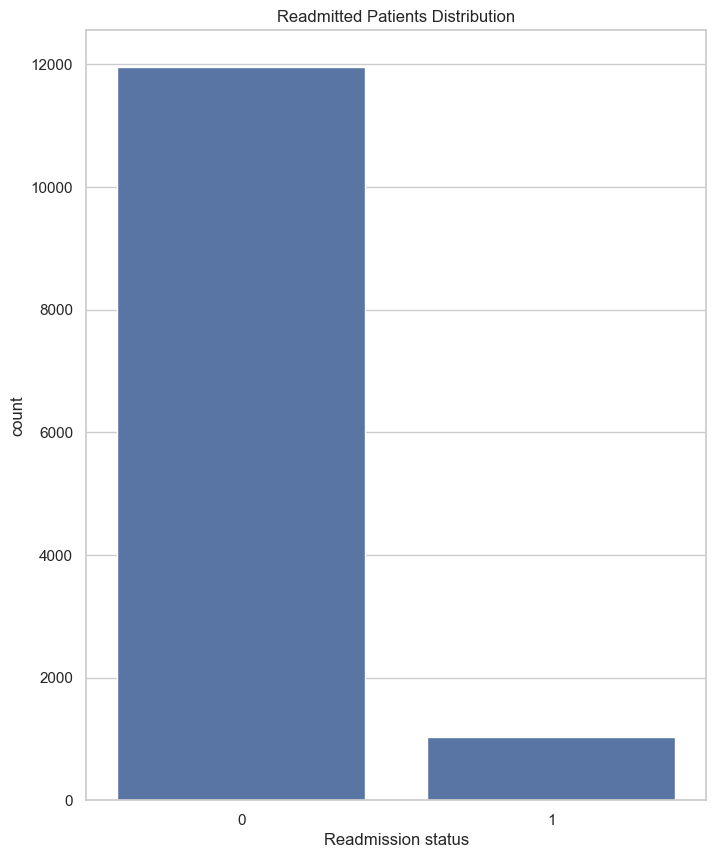

In [41]:
sns.set(style='whitegrid')
plt.figure(figsize=(8,10))
sns.countplot(data=df,x='readmitted')
plt.title('Readmitted Patients Distribution')
plt.xlabel('Readmission status')
plt.ylabel('count')
plt.show()

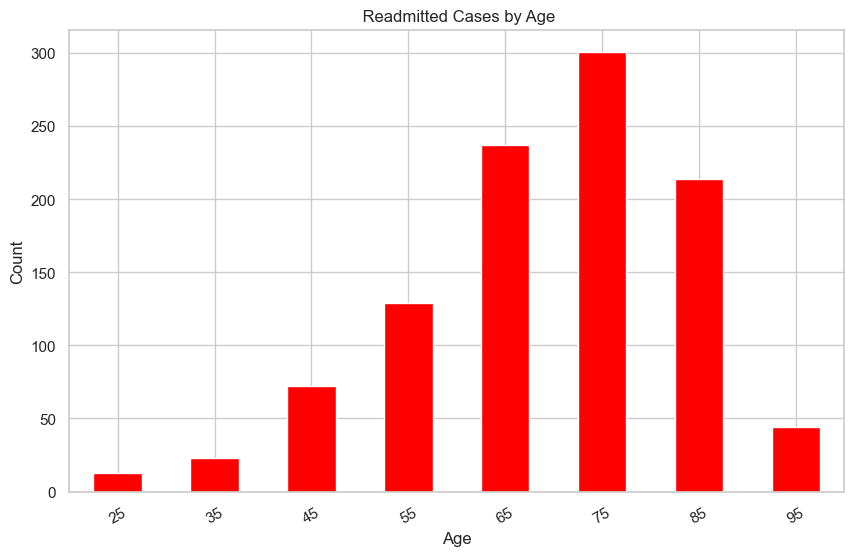

In [42]:
# The count of number of readmitted cases against age
readmitted_df = df[df['readmitted'] == 1]

# Grouping by age and count of readmitted cases
age_readmitted_counts = readmitted_df['age'].value_counts().sort_index()

# Plotting
age_readmitted_counts.plot(kind='bar', figsize=(10, 6), color='red')
plt.title(' Readmitted Cases by Age')
plt.xlabel('Age')
plt.ylabel('Count')
plt.xticks(rotation=30)
plt.show()

In [43]:
print("Readmitted Cases by Age:")
print(age_readmitted_counts)

Readmitted Cases by Age:
age
25     13
35     23
45     72
55    129
65    237
75    301
85    214
95     44
Name: count, dtype: int64


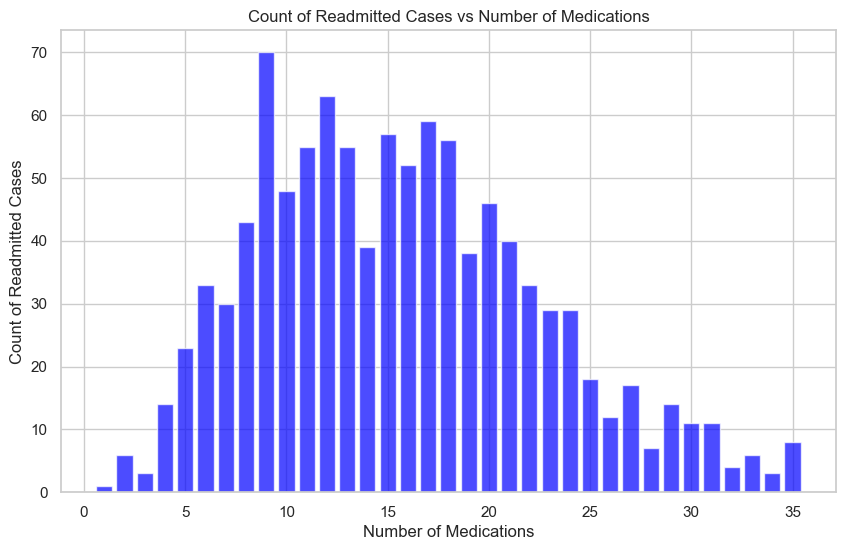

In [44]:
#Plot a graph that displays the count of target variable against the number of medications
# Filtering data for cases where 'readmitted' is '1'
readmitted_df = df[df['readmitted'] == 1]

# Grouping by number of medications and counting occurrences
medication_counts = readmitted_df['num_medications'].value_counts().sort_index()

# Plotting the graph
plt.figure(figsize=(10, 6))
plt.bar(medication_counts.index, medication_counts.values, color='blue', alpha=0.7)
plt.xlabel('Number of Medications')
plt.ylabel('Count of Readmitted Cases')
plt.title('Count of Readmitted Cases vs Number of Medications')
plt.grid(True)

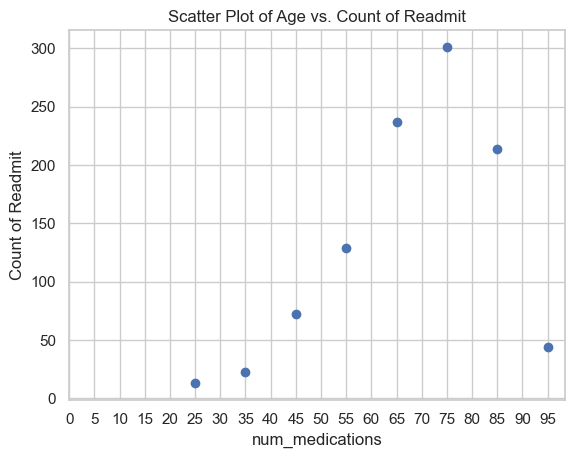

In [45]:
filtered_df = df[df['readmitted'] == 1]

# Count the occurrences of each age value in the filtered DataFrame
age_counts = filtered_df['age'].value_counts().sort_index()

# Plot the scatter plot of count of age values vs. 'readmitted'
plt.scatter(age_counts.index, age_counts.values)
plt.xlabel('num_medications')
plt.ylabel('Count of Readmit')
plt.title('Scatter Plot of Age vs. Count of Readmit')
plt.xticks(range(0, max(age_counts.index) + 1, 5))

plt.show()

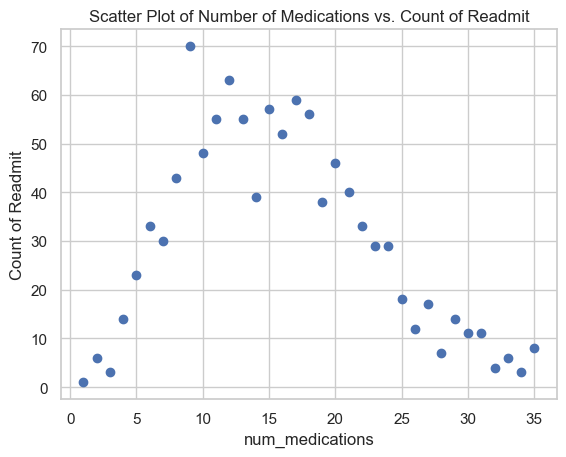

In [46]:
filtered_df = df[df['readmitted'] == 1]

# Count the occurrences of each age value in the filtered DataFrame
age_counts = filtered_df['num_medications'].value_counts().sort_index()

# Plot the scatter plot of count of age values vs. 'readmitted'
plt.scatter(age_counts.index, age_counts.values)
plt.xlabel('num_medications')
plt.ylabel('Count of Readmit')
plt.title('Scatter Plot of Number of Medications vs. Count of Readmit')
plt.xticks(range(0, max(age_counts.index) + 1, 5))

plt.show()

In [47]:
corr=df.corr()
corr

,patient_nbr,race,gender,age,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,payer_code,medical_specialty,...,number_diagnoses,metformin,glipizide,glyburide,pioglitazone,rosiglitazone,insulin,change,diabetesMed,readmitted
patient_nbr,1.000000,-0.079632,0.027073,0.074417,0.128977,0.048409,0.047259,0.008781,0.144920,0.059611,...,0.354878,0.025150,-0.032683,-0.016522,0.018937,0.001753,0.173142,-0.076551,0.018297,0.006142
race,-0.079632,1.000000,-0.032790,-0.162255,-0.046625,-0.039536,0.037641,-0.014188,0.140997,-0.068237,...,-0.129773,0.003057,0.026736,-0.016591,-0.003825,-0.012418,0.039939,-0.039642,-0.033828,-0.011967
gender,0.027073,-0.032790,1.000000,-0.091792,0.016701,-0.051865,0.002531,-0.055742,0.044473,0.014298,...,0.002189,0.016297,0.011769,0.033449,0.000965,0.010128,0.011211,-0.013987,-0.018845,-0.007241
age,0.074417,-0.162255,-0.091792,1.000000,-0.023604,0.166235,0.072467,0.129898,-0.341662,-0.058702,...,0.218497,-0.091796,0.038298,0.053110,-0.007913,-0.002732,-0.036974,0.035841,0.029054,0.049818
admission_type_id,0.128977,-0.046625,0.016701,-0.023604,1.000000,0.027178,-0.357479,-0.077285,0.063985,0.287704,...,0.018847,0.046107,-0.017599,0.002590,0.027607,0.021507,0.067574,-0.005579,0.034688,-0.005565
discharge_disposition_id,0.048409,-0.039536,-0.051865,0.166235,0.027178,1.000000,0.021334,0.165261,-0.066661,0.020688,...,0.140954,-0.014034,0.009517,-0.005835,-0.000163,0.014181,0.055041,-0.032765,-0.007384,0.067539
admission_source_id,0.047259,0.037641,0.002531,0.072467,-0.357479,0.021334,1.000000,0.053553,0.041319,-0.364579,...,0.127097,-0.027423,0.009774,0.003189,-0.025138,-0.021595,0.058877,-0.025083,0.008683,-0.001735
time_in_hospital,0.008781,-0.014188,-0.055742,0.129898,-0.077285,0.165261,0.053553,1.000000,-0.032922,-0.055301,...,0.219128,-0.005090,0.017545,0.038564,-0.013157,0.003556,0.090286,-0.131538,-0.104289,0.045745
payer_code,0.144920,0.140997,0.044473,-0.341662,0.063985,-0.066661,0.041319,-0.032922,1.000000,-0.024385,...,-0.039751,0.054700,0.008121,-0.010108,0.000758,-0.012059,0.123986,-0.066032,-0.024433,-0.014148
medical_specialty,0.059611,-0.068237,0.014298,-0.058702,0.287704,0.020688,-0.364579,-0.055301,-0.024385,1.000000,...,0.006438,0.025287,-0.010186,0.006367,-0.003225,0.015336,-0.037671,0.010695,-0.004759,0.001962


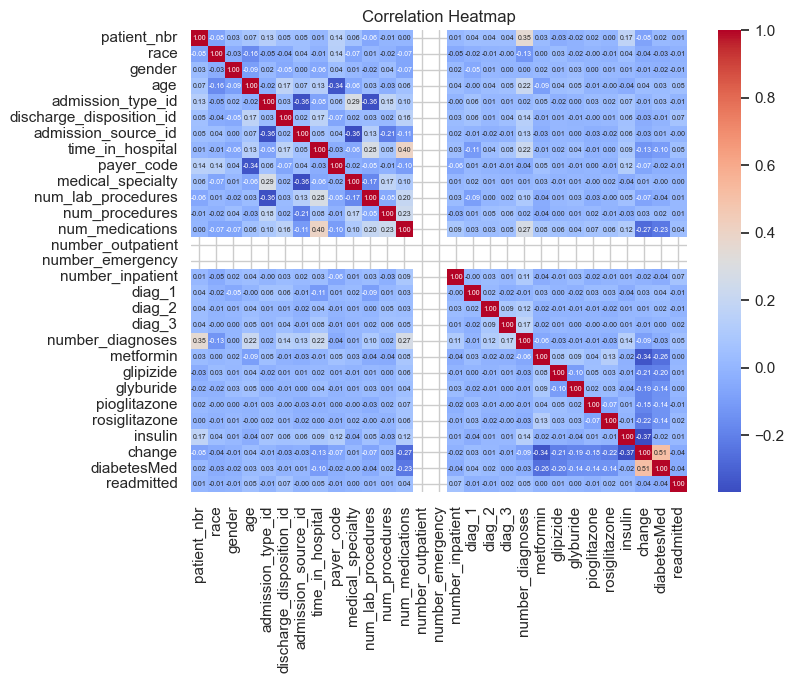

In [51]:
plt.figure(figsize=(8, 6))
sns.heatmap(corr, annot=True, cmap='coolwarm', fmt=".2f", annot_kws={"size": 5})
plt.title('Correlation Heatmap')
plt.show()

In [52]:
# Create a scatterplot matrix
sns.set(style="ticks")
sns.pairplot(df)
plt.show()

#### Model Building

In [53]:
df.head()

,patient_nbr,race,gender,age,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,payer_code,medical_specialty,...,number_diagnoses,metformin,glipizide,glyburide,pioglitazone,rosiglitazone,insulin,change,diabetesMed,readmitted
20446,20123568,1,1,75,1,22,7,7,0,0,...,9,0,0,0,0,0,0,0,0,0
20824,20408121,1,1,95,1,1,7,4,0,2,...,6,0,0,0,1,0,1,1,0,0
21083,20542797,1,2,75,1,2,7,10,0,3,...,6,1,0,0,1,0,0,0,0,0
23879,7239654,1,1,75,1,3,6,12,1,3,...,5,0,0,0,1,0,0,1,0,0
23922,15466212,1,2,75,1,3,6,12,0,3,...,5,0,0,0,1,0,1,1,1,0


In [54]:
df.shape

(12991, 29)

In [55]:
df.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
patient_nbr,12991.0,5.432964e+07,3.822412e+07,10377.0,23843074.5,42502914.0,91315831.5,189365864.0
race,12991.0,1.324917e+00,6.809587e-01,1.0,1.0,1.0,1.0,5.0
gender,12991.0,1.458548e+00,4.982980e-01,1.0,1.0,1.0,2.0,2.0
age,12991.0,6.691363e+01,1.538229e+01,5.0,55.0,65.0,75.0,95.0
admission_type_id,12991.0,1.943422e+00,8.975810e-01,1.0,1.0,2.0,3.0,6.0
discharge_disposition_id,12991.0,2.766608e+00,4.154339e+00,1.0,1.0,1.0,3.0,28.0
admission_source_id,12991.0,4.782927e+00,3.241449e+00,1.0,1.0,7.0,7.0,17.0
time_in_hospital,12991.0,4.025556e+00,2.572633e+00,1.0,2.0,3.0,5.0,12.0
payer_code,12991.0,2.464244e+00,3.430394e+00,0.0,0.0,0.0,4.0,15.0
medical_specialty,12991.0,7.234316e+00,8.840407e+00,0.0,2.0,3.0,8.0,52.0


In [56]:
print(list(df.select_dtypes(include=[np.number])))

['patient_nbr', 'race', 'gender', 'age', 'admission_type_id', 'discharge_disposition_id', 'admission_source_id', 'time_in_hospital', 'payer_code', 'medical_specialty', 'num_lab_procedures', 'num_procedures', 'num_medications', 'number_outpatient', 'number_emergency', 'number_inpatient', 'diag_1', 'diag_2', 'diag_3', 'number_diagnoses', 'metformin', 'glipizide', 'glyburide', 'pioglitazone', 'rosiglitazone', 'insulin', 'change', 'diabetesMed', 'readmitted']


In [59]:
numerical_features = ['patient_nbr', 'age', 'admission_type_id', 'discharge_disposition_id', 'admission_source_id',
                      'time_in_hospital', 'num_lab_procedures', 'num_procedures', 'num_medications', 'number_outpatient',
                      'number_emergency', 'number_inpatient', 'number_diagnoses', 'readmitted']

clf = linear_model.LogisticRegression()
X = df[numerical_features]
Y = df['readmitted']

clf.fit(X, Y)

# Printing model evaluation metrics and coefficients
print("Model score:\n {}".format(clf.score(X,Y)))
print("Intercept:\n {}".format(clf.intercept_))
print("Coefficients:\n")
for feat, coef in zip(numerical_features, clf.coef_[0]):
    print(" {:>20}: {}".format(feat, coef))

Model score:
 0.920483411592641
Intercept:
 [-0.00034568]
Coefficients:

          patient_nbr: -4.7441371977887775e-09
                  age: -0.021807680977316623
    admission_type_id: -0.0005872578160817827
 discharge_disposition_id: -0.0005217101544817233
  admission_source_id: -0.0015921576040561465
     time_in_hospital: -0.0012795177716383181
   num_lab_procedures: -0.014646504951667706
       num_procedures: -0.00039967947900307826
      num_medications: -0.004617650053693028
    number_outpatient: 0.0
     number_emergency: 0.0
     number_inpatient: -1.4927757406137957e-05
     number_diagnoses: -0.0019009412714703982
           readmitted: 0.00023390550192478154


In [60]:
# Splitting the data into training and testing sets
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2)

# Creating and fitting the logistic regression model
clf = linear_model.LogisticRegression()
clf.fit(X_train, Y_train)

# Printing model scores against training and test data
print("Score against training data: {}".format(clf.score(X_train, Y_train)))
print("Score against test data: {}".format(clf.score(X_test, Y_test)))

Score against training data: 0.9200346420323325
Score against test data: 0.9222777991535206


In [61]:
df_cat_cols = df.select_dtypes(include=['object']).columns.tolist()

In [62]:
le = LabelEncoder()
for col in df_cat_cols:
    df[col] = le.fit_transform(df[col])

In [63]:
df.head()

,patient_nbr,race,gender,age,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,payer_code,medical_specialty,...,number_diagnoses,metformin,glipizide,glyburide,pioglitazone,rosiglitazone,insulin,change,diabetesMed,readmitted
20446,20123568,1,1,75,1,22,7,7,0,0,...,9,0,0,0,0,0,0,0,0,0
20824,20408121,1,1,95,1,1,7,4,0,2,...,6,0,0,0,1,0,1,1,0,0
21083,20542797,1,2,75,1,2,7,10,0,3,...,6,1,0,0,1,0,0,0,0,0
23879,7239654,1,1,75,1,3,6,12,1,3,...,5,0,0,0,1,0,0,1,0,0
23922,15466212,1,2,75,1,3,6,12,0,3,...,5,0,0,0,1,0,1,1,1,0


In [64]:
# Create a logistic regression model
model = linear_model.LogisticRegression()

# Define the feature matrix X0 and the target variable Y0
X0 = df.loc[:, df.columns != 'readmitted']
Y0 = df['readmitted']

# Initialize the RFE selector with a logistic regression model and select 15 features with a step of 2
selector = feature_selection.RFE(model, n_features_to_select=15, step=2)

# Fit the selector to the data
selector = selector.fit(X0, Y0)

# Get the selected features based on the support_ attribute of the selector
selected_features = X0.loc[:, selector.support_]

# Print the selected features
print("Selected features:\n{}".format(',\n'.join(list(selected_features))))

Selected features:
race,
gender,
admission_type_id,
discharge_disposition_id,
admission_source_id,
time_in_hospital,
num_procedures,
number_diagnoses,
metformin,
glipizide,
pioglitazone,
rosiglitazone,
insulin,
change,
diabetesMed


In [65]:
# Assigning selected features to X
X = selected_features

# Assigning the target variable 'income' to Y
Y = df['readmitted']

# Splitting the data into training and testing sets
trainX, testX, trainY, testY = train_test_split(X, Y, test_size=0.2, random_state=0)

# Creating a logistic regression classifier
clf = linear_model.LogisticRegression()

# Fitting the classifier to the training data
clf.fit(trainX, trainY)

# Predicting the target variable for the test set
predicted = clf.predict(testX)

# Calculating the mean hits (proportion of correctly predicted instances)
mean_hits = np.mean(predicted == testY)

# Calculating the accuracy score
acc = accuracy_score(testY, predicted)

# Performing 10-fold cross-validation and computing the mean scores
scores = cross_val_score(linear_model.LogisticRegression(), X, Y, scoring='accuracy')
cross_val_mean_scores = scores.mean()

# Printing the mean hits, accuracy score, and cross-validation mean scores
print("Mean hits: {}".format(mean_hits))
print("Accuracy score: {}".format(acc))
print("Cross-validation mean scores: {}".format(cross_val_mean_scores))

Mean hits: 0.9292035398230089
Accuracy score: 0.9292035398230089
Cross-validation mean scores: 0.9204834215564048


AUC = 0.593167701863354


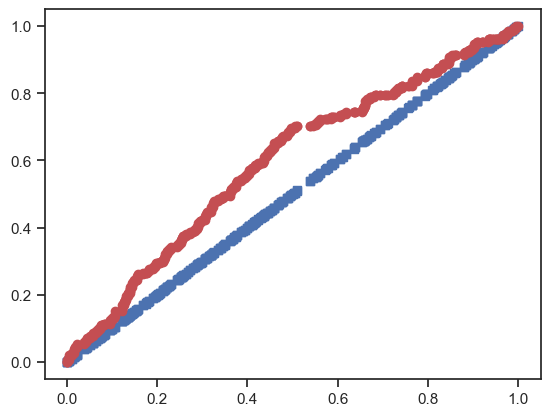

In [75]:
# Predicting probabilities for the positive class
prob = np.array(clf.predict_proba(testX)[:, 1])

# Incrementing testY by 1 to convert the labels to 1 and 2
testY += 1

# Calculating the false positive rate and sensitivity (true positive rate) for ROC curve
fpr, sensitivity, _ = roc_curve(testY, prob, pos_label=2)

# Computing the Area Under Curve (AUC) for the ROC curve
print("AUC = {}".format(auc(fpr, sensitivity)))

# Plotting the ROC curve
plt.scatter(fpr, fpr, c='b', marker='s')  # Plotting the line y = x (diagonal)
plt.scatter(fpr, sensitivity, c='r', marker='o')  # Plotting the ROC curve
plt.show()

[[0.87668819 0.12331181]
 [0.8942844  0.1057156 ]
 [0.93088034 0.06911966]
 ...
 [0.93680925 0.06319075]
 [0.95872578 0.04127422]
 [0.91380649 0.08619351]]


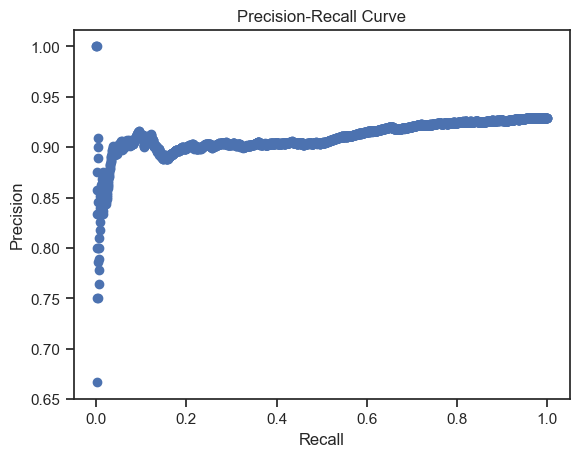

In [76]:
pred_score = clf.predict_proba(testX)
print(pred_score)

# Adjusting testY to binary labels
testY_binary = testY.copy()
testY_binary[testY_binary == 2] = 0  # Assuming label 2 is the negative class

p, r, t = precision_recall_curve(y_true=testY_binary, probas_pred=pred_score[:, 1])

plt.figure()
plt.scatter(r, p)
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.show()

In [80]:
# Create an undersampler object
undersampler = RandomUnderSampler(random_state=42)

# Undersample the data
X_undersampled, y_undersampled = undersampler.fit_resample(X, Y)

# Check the new class distribution
print("Original dataset shape:", Counter(Y))
print("Undersampled dataset shape:", Counter(y_undersampled))

# Split the undersampled data into train and test sets
trainX, testX, trainY, testY = train_test_split(X_undersampled, y_undersampled, test_size=0.2, random_state=0)


# Creating a logistic regression classifier
clf_under = linear_model.LogisticRegression()

# Fitting the classifier to the training data
clf_under.fit(trainX, trainY)

# Predicting the target variable for the test set
predicted = clf_under.predict(testX)

# Calculating the mean hits (proportion of correctly predicted instances)
mean_hits = np.mean(predicted == testY)

# Calculating the accuracy score
accuracy_score = accuracy_score(testY, predicted)

# Performing 10-fold cross-validation and computing the mean scores
scores = cross_val_score(linear_model.LogisticRegression(), X_undersampled, y_undersampled, scoring='accuracy', cv=10)
cross_val_mean_scores = scores.mean()


# Printing the mean hits, accuracy score, and cross-validation mean scores
print("Mean hits: {}".format(mean_hits))
print("Accuracy score: {}".format(accuracy_score))
print("Cross-validation mean scores: {}".format(cross_val_mean_scores))

Original dataset shape: Counter({0: 11958, 1: 1033})
Undersampled dataset shape: Counter({0: 1033, 1: 1033})
Mean hits: 0.572463768115942
Accuracy score: 0.572463768115942
Cross-validation mean scores: 0.5484850616762816


AUC = 0.5964233081475591


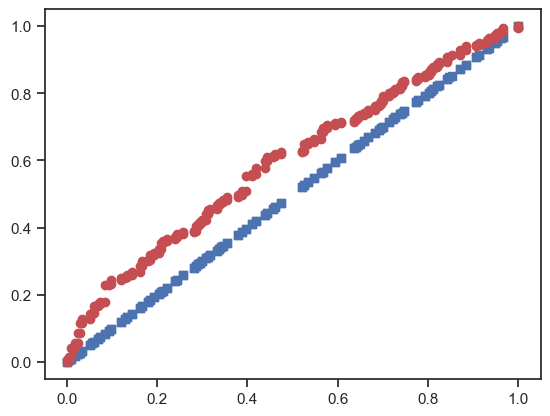

In [82]:
# Predicting probabilities for the positive class
prob = np.array(clf_under.predict_proba(testX)[:, 1])

# Incrementing testY by 1 to convert the labels to 1 and 2
testY += 1

# Calculating the false positive rate and sensitivity (true positive rate) for ROC curve
fpr, sensitivity, _ = roc_curve(testY, prob, pos_label=2)

# Computing the Area Under Curve (AUC) for the ROC curve
print("AUC = {}".format(auc(fpr, sensitivity)))

# Plotting the ROC curve
plt.scatter(fpr, fpr, c='b', marker='s')  # Plotting the line y = x (diagonal)
plt.scatter(fpr, sensitivity, c='r', marker='o')  # Plotting the ROC curve
plt.show()

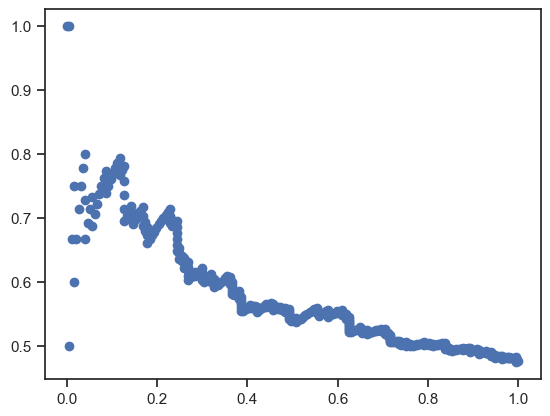

In [83]:
pred_score = clf_under.predict_proba(testX)

testY = testY - 1  # Assuming testY has values 1 and 2

p,r,t = precision_recall_curve(y_true=testY, probas_pred=pred_score[:,1])
plt.figure()
plt.scatter(r,p)
plt.show()

In [87]:
# Create an undersampler object
oversampler = RandomOverSampler(random_state=42)

# Undersample the data
X_over, y_over = oversampler.fit_resample(X, Y)

# Check the new class distribution
print("Original dataset shape:", Counter(Y))
print("Oversampled dataset shape:", Counter(y_over))

# Split the undersampled data into train and test sets
trainX, testX, trainY, testY = train_test_split(X_over, y_over, test_size=0.2, random_state=0)


# Creating a logistic regression classifier
clf_over = linear_model.LogisticRegression()

# Fitting the classifier to the training data
clf_over.fit(trainX, trainY)

# Predicting the target variable for the test set
predicted = clf_over.predict(testX)

# Calculating the mean hits (proportion of correctly predicted instances)
mean_hits = np.mean(predicted == testY)

# Calculating the accuracy score
accuracy_score = accuracy_score(testY, predicted)

# Performing 10-fold cross-validation and computing the mean scores
scores = cross_val_score(linear_model.LogisticRegression(), X_over, y_over, scoring='accuracy', cv=10)
cross_val_mean_scores = scores.mean()


# Printing the mean hits, accuracy score, and cross-validation mean scores
print("Mean hits: {}".format(mean_hits))
print("Accuracy score: {}".format(accuracy_score))
print("Cross-validation mean scores: {}".format(cross_val_mean_scores))

Original dataset shape: Counter({0: 11958, 1: 1033})
Oversampled dataset shape: Counter({0: 11958, 1: 11958})
Mean hits: 0.5641722408026756
Accuracy score: 0.5641722408026756
Cross-validation mean scores: 0.552050802969329


AUC = 0.5845783028071311


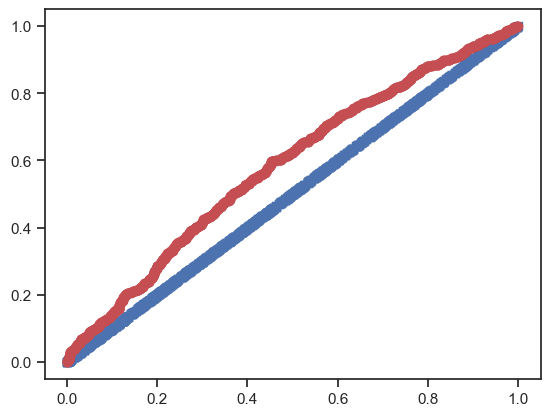

In [89]:
# Predicting probabilities for the positive class
prob = np.array(clf_over.predict_proba(testX)[:, 1])

# Incrementing testY by 1 to convert the labels to 1 and 2
testY += 1

# Calculating the false positive rate and sensitivity (true positive rate) for ROC curve
fpr, sensitivity, _ = roc_curve(testY, prob, pos_label=2)

# Computing the Area Under Curve (AUC) for the ROC curve
print("AUC = {}".format(auc(fpr, sensitivity)))

# Plotting the ROC curve
plt.scatter(fpr, fpr, c='b', marker='s')  # Plotting the line y = x (diagonal)
plt.scatter(fpr, sensitivity, c='r', marker='o')  # Plotting the ROC curve
plt.show()

[[0.43131817 0.56868183]
 [0.43992241 0.56007759]
 [0.51766297 0.48233703]
 ...
 [0.41994878 0.58005122]
 [0.48476541 0.51523459]
 [0.45192166 0.54807834]]


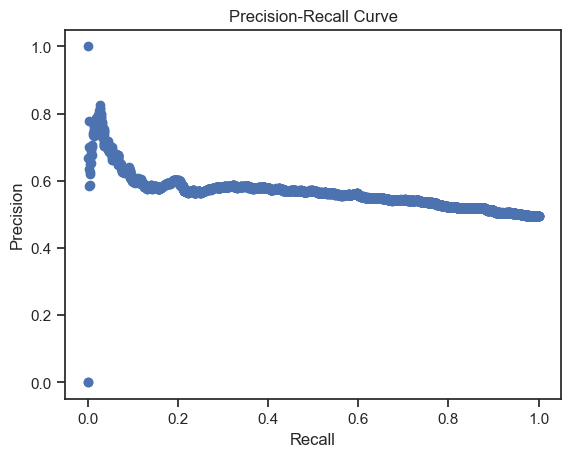

In [90]:
pred_score = clf_over.predict_proba(testX)
print(pred_score)

testY = testY - 1  # testY has values 1 and 2

p, r, t = precision_recall_curve(y_true=testY, probas_pred=pred_score[:, 1])

plt.figure()
plt.scatter(r, p)

# Add labels to the x-axis and y-axis
plt.xlabel('Recall')
plt.ylabel('Precision')

# Add a title to the plot (optional)
plt.title('Precision-Recall Curve')

plt.show()

# Part 2

### Cleaning and Transformation

In [91]:
df = pd.read_csv('diabetic_data.csv')
df.head()

,encounter_id,patient_nbr,race,gender,age,weight,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,...,citoglipton,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone,change,diabetesMed,readmitted
0,2278392,8222157,Caucasian,Female,[0-10),?,6,25,1,1,...,No,No,No,No,No,No,No,No,No,NO
1,149190,55629189,Caucasian,Female,[10-20),?,1,1,7,3,...,No,Up,No,No,No,No,No,Ch,Yes,>30
2,64410,86047875,AfricanAmerican,Female,[20-30),?,1,1,7,2,...,No,No,No,No,No,No,No,No,Yes,NO
3,500364,82442376,Caucasian,Male,[30-40),?,1,1,7,2,...,No,Up,No,No,No,No,No,Ch,Yes,NO
4,16680,42519267,Caucasian,Male,[40-50),?,1,1,7,1,...,No,Steady,No,No,No,No,No,Ch,Yes,NO


In [92]:
df.shape

(101766, 50)

In [93]:
df.dtypes

encounter_id                 int64
patient_nbr                  int64
race                        object
gender                      object
age                         object
weight                      object
admission_type_id            int64
discharge_disposition_id     int64
admission_source_id          int64
time_in_hospital             int64
payer_code                  object
medical_specialty           object
num_lab_procedures           int64
num_procedures               int64
num_medications              int64
number_outpatient            int64
number_emergency             int64
number_inpatient             int64
diag_1                      object
diag_2                      object
diag_3                      object
number_diagnoses             int64
max_glu_serum               object
A1Cresult                   object
metformin                   object
repaglinide                 object
nateglinide                 object
chlorpropamide              object
glimepiride         

In [94]:
df = df.drop('encounter_id', axis=1)

In [95]:
print('Total data = ', len(df))
print('Unique entries = ', len(np.unique(df['patient_nbr'])))
df.drop_duplicates(['patient_nbr'], keep = 'first', inplace = True)
print('Length after removing Duplicates:', len(df))

Total data =  101766
Unique entries =  71518
Length after removing Duplicates: 71518


In [96]:
# replacing '?' wiht NaN
df.replace(regex=r'\?', value=np.nan, inplace=True)

In [97]:
df.isnull().sum()

patient_nbr                     0
race                         1948
gender                          0
age                             0
weight                      68665
admission_type_id               0
discharge_disposition_id        0
admission_source_id             0
time_in_hospital                0
payer_code                  31043
medical_specialty           34477
num_lab_procedures              0
num_procedures                  0
num_medications                 0
number_outpatient               0
number_emergency                0
number_inpatient                0
diag_1                         11
diag_2                        294
diag_3                       1225
number_diagnoses                0
max_glu_serum               68062
A1Cresult                   58532
metformin                       0
repaglinide                     0
nateglinide                     0
chlorpropamide                  0
glimepiride                     0
acetohexamide                   0
glipizide     

In [98]:
missing_values = df.isnull().sum()

# Create a DataFrame with only the columns containing missing values
missing_data_table = pd.DataFrame({'Column Name': df.columns,
                                   'Missing Values': missing_values[df.columns],
                                   'Missing Percentage': (missing_values[df.columns] / len(df)) * 100})

# Display the missing data table
print(missing_data_table.to_string(index=False))

             Column Name  Missing Values  Missing Percentage
             patient_nbr               0            0.000000
                    race            1948            2.723790
                  gender               0            0.000000
                     age               0            0.000000
                  weight           68665           96.010794
       admission_type_id               0            0.000000
discharge_disposition_id               0            0.000000
     admission_source_id               0            0.000000
        time_in_hospital               0            0.000000
              payer_code           31043           43.405856
       medical_specialty           34477           48.207444
      num_lab_procedures               0            0.000000
          num_procedures               0            0.000000
         num_medications               0            0.000000
       number_outpatient               0            0.000000
        number_emergency

In [99]:
# dropping columns with large number of missing values (>80%)
df = df.drop(['weight', 'max_glu_serum', 'A1Cresult', 'payer_code'], axis=1)

In [100]:
# these are categorical variables so we can't use mean of median.
diag_1 = df['diag_1'].mode()[0]
diag_2 = df['diag_2'].mode()[0]
diag_3 = df['diag_3'].mode()[0]

df['diag_1'] = df['diag_1'].fillna(diag_1)
df['diag_2'] = df['diag_2'].fillna(diag_2)
df['diag_3'] = df['diag_3'].fillna(diag_3)

In [101]:
df.isnull().sum()

patient_nbr                     0
race                         1948
gender                          0
age                             0
admission_type_id               0
discharge_disposition_id        0
admission_source_id             0
time_in_hospital                0
medical_specialty           34477
num_lab_procedures              0
num_procedures                  0
num_medications                 0
number_outpatient               0
number_emergency                0
number_inpatient                0
diag_1                          0
diag_2                          0
diag_3                          0
number_diagnoses                0
metformin                       0
repaglinide                     0
nateglinide                     0
chlorpropamide                  0
glimepiride                     0
acetohexamide                   0
glipizide                       0
glyburide                       0
tolbutamide                     0
pioglitazone                    0
rosiglitazone 

After research we found that medical_specialty is important feature however it has too many distinct values so when we apply one hot encoding it will unneccessarily create lots of features. To group them into smaller number of categories we used frequency based approach and domain knowledege like all kind of surgons should be put under 'surgon' category. <br>

<p>
We failed to group below medical specialist so we grouped them into 'ungrouped' category. <br>
Endocrinology -- glands <br>
Gastroenterology --stomach <br>
Gynecology -- women reproduction system <br>
Hematology -- Blood <br>
Hematology/Oncology -- Blood <br>
Hospitalist -- one who takes care of admitted patients <br>
Oncology -- cancer <br>
Ophthalmology -- eye <br>
otolaryngology -- ears, nose, and throat <br>
Pulmonology -- respiratory <br>
radiology -- diagnosing and treating injuries and diseases using medical imaging (radiology) procedures (exams/tests) such as X-rays <br>
</p>

In [102]:
high_frequency = ['InternalMedicine', 'Family/GeneralPractice', 'Cardiology', 'Surgery-General', 'Orthopedics', 'Orthopedics-Reconstructive', 
                 'Emergency/Trauma', 'Urology','ObstetricsandGynecology','Psychiatry','Pulmonology ','Nephrology','Radiologist']

low_frequency = ['Surgery-PlasticwithinHeadandNeck','Psychiatry-Addictive','Proctology','Dermatology','SportsMedicine','Speech','Perinatology',\
                'Neurophysiology','Resident','Pediatrics-Hematology-Oncology','Pediatrics-EmergencyMedicine','Dentistry','DCPTEAM','Psychiatry-Child/Adolescent',\
                'Pediatrics-Pulmonology','Surgery-Pediatric','AllergyandImmunology','Pediatrics-Neurology','Anesthesiology','Pathology','Cardiology-Pediatric',\
                'Endocrinology-Metabolism','PhysicianNotFound','Surgery-Colon&Rectal','OutreachServices',\
                'Surgery-Maxillofacial','Rheumatology','Anesthesiology-Pediatric','Obstetrics','Obsterics&Gynecology-GynecologicOnco']

pediatrics = ['Pediatrics','Pediatrics-CriticalCare','Pediatrics-EmergencyMedicine','Pediatrics-Endocrinology','Pediatrics-Hematology-Oncology',\
               'Pediatrics-Neurology','Pediatrics-Pulmonology', 'Anesthesiology-Pediatric', 'Cardiology-Pediatric', 'Surgery-Pediatric']

psychic = ['Psychiatry-Addictive', 'Psychology', 'Psychiatry',  'Psychiatry-Child/Adolescent', 'PhysicalMedicineandRehabilitation', 'Osteopath']


neurology = ['Neurology', 'Surgery-Neuro',  'Pediatrics-Neurology', 'Neurophysiology']


surgery = ['Surgeon', 'Surgery-Cardiovascular', \
          'Surgery-Cardiovascular/Thoracic', 'Surgery-Colon&Rectal', 'Surgery-General', 'Surgery-Maxillofacial', \
             'Surgery-Plastic', 'Surgery-PlasticwithinHeadandNeck',  'Surgery-Thoracic',\
             'Surgery-Vascular', 'SurgicalSpecialty', 'Podiatry']
             
ungrouped = ['Endocrinology','Gastroenterology','Gynecology','Hematology','Hematology/Oncology','Hospitalist','InfectiousDiseases',\
           'Oncology','Ophthalmology','Otolaryngology','Pulmonology','Radiology']



colMedical = []

for val in df['medical_specialty'] :
    if val in pediatrics :
        colMedical.append('pediatrics')
    elif val in psychic :
        colMedical.append('psychic')
    elif val in neurology :
        colMedical.append('neurology')
    elif val in surgery :
        colMedical.append('surgery')
    elif val in high_frequency :
        colMedical.append('high_freq')
    elif val in low_frequency :
        colMedical.append('low_freq')
    elif val in ungrouped :
        colMedical.append('ungrouped')
    else:
        colMedical.append('missing')

df['medical_specialty'] = colMedical

In [103]:
df.isnull().sum()

patient_nbr                    0
race                        1948
gender                         0
age                            0
admission_type_id              0
discharge_disposition_id       0
admission_source_id            0
time_in_hospital               0
medical_specialty              0
num_lab_procedures             0
num_procedures                 0
num_medications                0
number_outpatient              0
number_emergency               0
number_inpatient               0
diag_1                         0
diag_2                         0
diag_3                         0
number_diagnoses               0
metformin                      0
repaglinide                    0
nateglinide                    0
chlorpropamide                 0
glimepiride                    0
acetohexamide                  0
glipizide                      0
glyburide                      0
tolbutamide                    0
pioglitazone                   0
rosiglitazone                  0
acarbose  

In [104]:
df['gender'][df['gender'] == 'Unknown/Invalid'].count()

3

In [105]:
df.drop(df[df['gender'] == 'Unknown/Invalid'].index, inplace=True)

In [106]:
df.race.unique()

array(['Caucasian', 'AfricanAmerican', nan, 'Other', 'Asian', 'Hispanic'],
      dtype=object)

In [107]:
print("Proportion of Race")
print(df.race.value_counts(normalize = True)*100)

Proportion of Race
race
Caucasian          76.889132
AfricanAmerican    18.524055
Hispanic            2.180569
Other               1.691846
Asian               0.714399
Name: proportion, dtype: float64


In [108]:
mapped_race = {"Asian":"Other","Hispanic":"Other"}
df.race = df.race.replace(mapped_race)

print("Proportion of Race After the Mapping")
print(df.race.value_counts(normalize= True)*100)

Proportion of Race After the Mapping
race
Caucasian          76.889132
AfricanAmerican    18.524055
Other               4.586813
Name: proportion, dtype: float64


In [109]:
df["race"].fillna(df["race"].mode()[0], inplace = True)

In [110]:
df.citoglipton.unique()

array(['No'], dtype=object)

In [111]:
df.examide.unique()

array(['No'], dtype=object)

In [112]:
df = df.drop(['citoglipton', 'examide'], axis = 1)

In [113]:
df.drop(['patient_nbr'], axis=1, inplace=True)

In [114]:
# convert cat race to num
replace_dict = {'Caucasian': 0, 'AfricanAmerican': 1, 'Other': 2}

df['race'] = df['race'].apply(lambda x: replace_dict[x])

In [115]:
df['gender'] = df['gender'].apply(lambda x: 1 if x == 'Male' else 0)

In [116]:
# convert cat age to num
replace_dict = {'[0-10)': 5,
                '[10-20)': 15,
                '[20-30)': 25,
                '[30-40)': 35,
                '[40-50)': 45,
                '[50-60)': 55,
                '[60-70)': 65,
                '[70-80)': 75,
                '[80-90)': 85,
                '[90-100)': 95}

df['age'] = df['age'].apply(lambda x: replace_dict[x])

In [117]:
# response variable 'readmitted', <30 -> 0, >30 1
df['readmitted'] = df['readmitted'].replace({'<30': 1, '>30': 0, 'NO': 0})

In [118]:
# from IDS mapping
df['discharge_disposition_id'] = df['discharge_disposition_id'].apply(lambda x : 1 if int(x) in [6, 7, 8]
                                                                           else ( 2 if int(x) in [3, 4, 5, 10, 15, 16, 17, 22, 23, 24, 27, 28, 29, 30]
                                                                           else ( 9 if int(x) in [12]
                                                                           else ( 11 if int(x) in [19, 20, 21]
                                                                           else ( 18 if int(x) in [25, 26]
                                                                           else ( 13 if int(x) in [14] 
                                                                           else int(x) ))))))

df = df[~df.discharge_disposition_id.isin([11,19,20,21])]

In [119]:
# 1 - emergency, 2 - urgent, 7 - trama center
# 3 - elective, 4 -new_born
# 5 - not applicable, 6 - null, 8 - not mapped
df['admission_type_id'] = df['admission_type_id'].apply(lambda x : 1 if int(x) in [2, 7]
                                                            else ( 5 if int(x) in [6, 8]
                                                            else int(x) ))

In [120]:
df['admission_source_id'] = df['admission_source_id'].apply(lambda x : 1 if int(x) in [2, 3]
                                                            else ( 4 if int(x) in [5, 6, 10, 22, 25, 26, 18]
                                                            else ( 9 if int(x) in [15, 17, 20, 21]
                                                            else ( 11 if int(x) in [12, 13, 14]
                                                            else ( 7 if int(x) in [8, 19, 23, 24]
                                                            else int(x) )))))

In [121]:
for col in ["metformin", "repaglinide", "nateglinide", "chlorpropamide", "glimepiride", "acetohexamide", "glipizide", "glyburide", "tolbutamide", "pioglitazone", "rosiglitazone", "acarbose", "miglitol", "troglitazone", "tolazamide", "insulin", "glyburide-metformin", "glipizide-metformin", "glimepiride-pioglitazone", "metformin-rosiglitazone", "metformin-pioglitazone"]:
    df[col] = df[col].apply(lambda x : 10 if x == 'Up' 
                                              else ( -10 if x == 'Down'                                                          
                                              else ( 0 if x == 'Steady'
                                              else  -20)))


df['change'] = df['change'].apply(lambda x : 1 if x == 'Ch'
                                                 else -1)


df['diabetesMed'] = df['diabetesMed'].apply(lambda x : -1 if x == 'No'
                                                else 1)

In [122]:
# from research
print(len(np.unique(df['diag_1'])))  
print(len(np.unique(df['diag_2'])))  
print(len(np.unique(df['diag_3'])))  

df['diag_1'] = df['diag_1'].apply(lambda x : 'other' if (str(x).find('V') != -1 or str(x).find('E') != -1)  
                                        else ('circulatory' if int(float(x)) in range(390, 460) or int(float(x)) == 785
                                        else     ('respiratory' if int(float(x)) in range(460, 520) or int(float(x)) == 786
                                        else     ('digestive'   if int(float(x)) in range(520, 580) or int(float(x)) == 787
                                        else     ('diabetes'    if int(float(x)) == 250
                                        else     ('injury'      if int(float(x)) in range(800, 1000)
                                        else ('musculoskeletal' if int(float(x)) in range(710, 740)
                                        else ('genitourinary'   if int(float(x)) in range(580, 630) or int(float(x)) == 788
                                        else ('neoplasms'       if int(float(x)) in range(140, 240)
                                        else ('pregnecy'        if int(float(x)) in range(630, 680)
                                        else 'other'))))))))))

df['diag_2'] = df['diag_2'].apply(lambda x : 'other' if (str(x).find('V') != -1 or str(x).find('E') != -1)  
                                        else ('circulatory' if int(float(x)) in range(390, 460) or int(float(x)) == 785
                                        else     ('respiratory' if int(float(x)) in range(460, 520) or int(float(x)) == 786
                                        else     ('digestive'   if int(float(x)) in range(520, 580) or int(float(x)) == 787
                                        else     ('diabetes'    if int(float(x)) == 250
                                        else     ('injury'      if int(float(x)) in range(800, 1000)
                                        else ('musculoskeletal' if int(float(x)) in range(710, 740)
                                        else ('genitourinary'   if int(float(x)) in range(580, 630) or int(float(x)) == 788
                                        else ('neoplasms'       if int(float(x)) in range(140, 240)
                                        else ('pregnecy'        if int(float(x)) in range(630, 680)
                                        else 'other'))))))))))

df['diag_3'] = df['diag_3'].apply(lambda x : 'other' if (str(x).find('V') != -1 or str(x).find('E') != -1)  
                                        else ('circulatory' if int(float(x)) in range(390, 460) or int(float(x)) == 785
                                        else     ('respiratory' if int(float(x)) in range(460, 520) or int(float(x)) == 786
                                        else     ('digestive'   if int(float(x)) in range(520, 580) or int(float(x)) == 787
                                        else     ('diabetes'    if int(float(x)) == 250
                                        else     ('injury'      if int(float(x)) in range(800, 1000)
                                        else ('musculoskeletal' if int(float(x)) in range(710, 740)
                                        else ('genitourinary'   if int(float(x)) in range(580, 630) or int(float(x)) == 788
                                        else ('neoplasms'       if int(float(x)) in range(140, 240)
                                        else ('pregnecy'        if int(float(x)) in range(630, 680)
                                        else 'other'))))))))))  

print(np.unique(df['diag_1']), '\n')           
print(np.unique(df['diag_2']), '\n')
print(np.unique(df['diag_3']), '\n')                         

695
724
757
['circulatory' 'diabetes' 'digestive' 'genitourinary' 'injury'
 'musculoskeletal' 'neoplasms' 'other' 'pregnecy' 'respiratory'] 

['circulatory' 'diabetes' 'digestive' 'genitourinary' 'injury'
 'musculoskeletal' 'neoplasms' 'other' 'pregnecy' 'respiratory'] 

['circulatory' 'diabetes' 'digestive' 'genitourinary' 'injury'
 'musculoskeletal' 'neoplasms' 'other' 'pregnecy' 'respiratory'] 



<p>
If the frequency of person's visit to the hospital is 
high then we can think of that person to be less healthier 
and less healthier patient tends to readmit quickly
lets create health_index variable.Higher the health_index lesser the chance that person will readmit (indirectely propotional)<br>
Health_index = ( 1 / (number_emergency + number_inpatient + number_outpatient) ) <br> <br>
 </p>

In [123]:
df['health_index'] = df.apply(lambda x:  1 / (x['number_emergency'] + x['number_inpatient'] + x['number_outpatient'])
                                  if x['number_emergency'] != 0 or x['number_inpatient'] != 0 or x['number_outpatient'] != 0
                                  else 1, axis = 1)

<p>
Severity of disease is high if patient is spending lots of time in hospital and going through number of complicated test so, lets create severity of disease as feature. To get probablistic interpretation lets divide it by total values.
<br>
   severity_of_disease = (time_in_hospital + num_procedures + num_medications + num_lab_procedures + number_of_diagnoses) </p> <br>



In [124]:
total = df['time_in_hospital'].sum() + df['num_procedures'].sum() + \
                              df['num_medications'].sum() + df['num_lab_procedures'].sum() + \
                              df['number_diagnoses'].sum()

df['severity_of_disease'] = (df['time_in_hospital'] + df['num_procedures'] + \
                              df['num_medications'] + df['num_lab_procedures'] + \
                              df['number_diagnoses']) / total

<p>
 Research has found that the patient which keep going through changes(up/down) in proportion of medications is tend to readmit so we have engineered new variable called as 'number_of_changes'. This captures number of  medications whose proportion have changed for each patient.
</p>

In [125]:
drugList = ['metformin','repaglinide','nateglinide','chlorpropamide','glimepiride','acetohexamide',\
            'glipizide','glyburide','tolbutamide','pioglitazone','rosiglitazone','acarbose','miglitol',\
            'troglitazone','tolazamide','insulin','glyburide-metformin','glipizide-metformin',\
            'glimepiride-pioglitazone','metformin-rosiglitazone','metformin-pioglitazone']

# Create a boolean mask for the desired conditions
mask = df[drugList].isin([10, -10])

# Count the number of True values (changes) across all drug columns
df['number_of_changes'] = mask.sum(axis=1)

### Visualisation

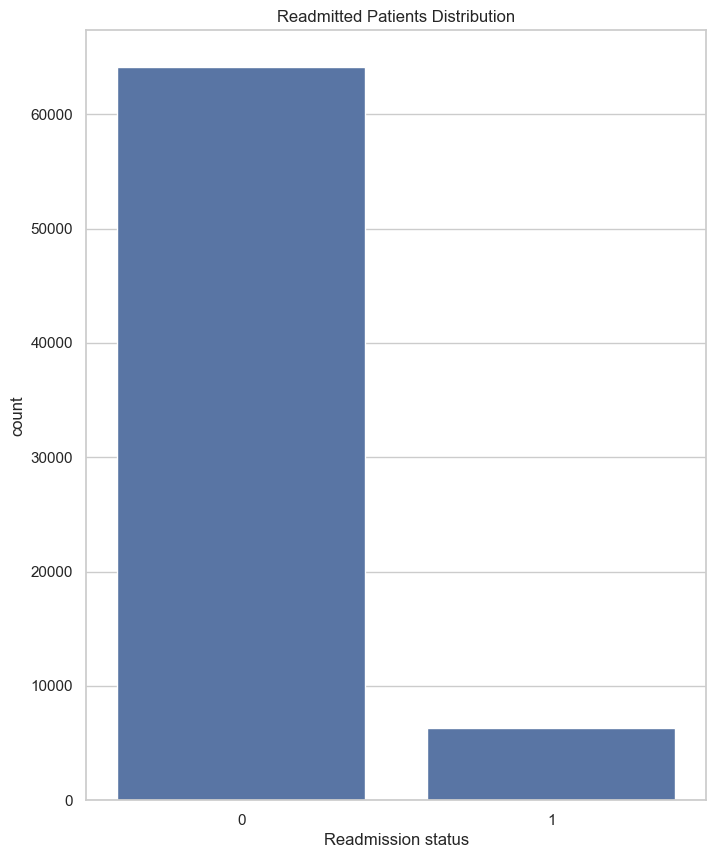

In [127]:
# the distribution of unique classes of the target variable, i.e., readmitted
sns.set(style='whitegrid')
plt.figure(figsize=(8,10))
sns.countplot(data=df,x='readmitted')
plt.title('Readmitted Patients Distribution')
plt.xlabel('Readmission status')
plt.ylabel('count')
plt.show()

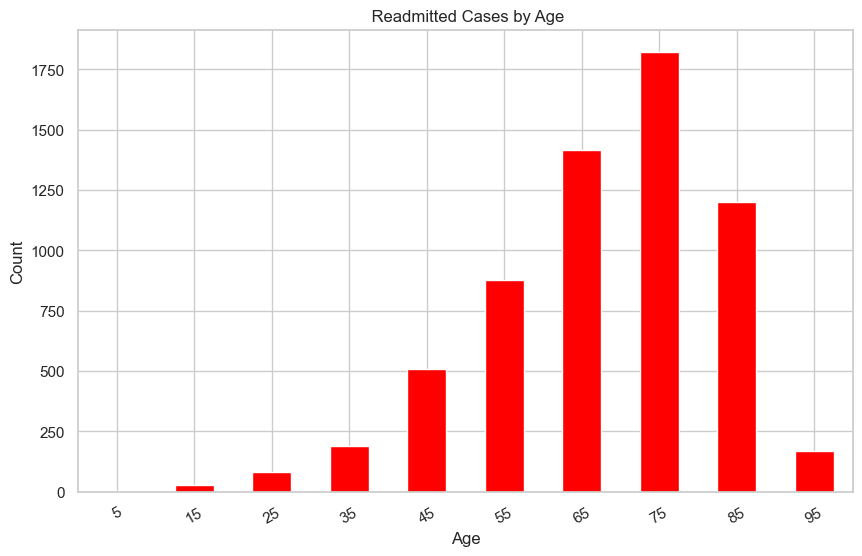

In [128]:
# The count of number of readmitted cases against age
readmitted_df = df[df['readmitted'] == 1]

# Grouping by age and count of readmitted cases
age_readmitted_counts = readmitted_df['age'].value_counts().sort_index()

# Plotting
age_readmitted_counts.plot(kind='bar', figsize=(10, 6), color='red')
plt.title(' Readmitted Cases by Age')
plt.xlabel('Age')
plt.ylabel('Count')
plt.xticks(rotation=30)
plt.show()

In [129]:
print("Readmitted Cases by Age:")
print(age_readmitted_counts)

Readmitted Cases by Age:
age
5        3
15      26
25      83
35     188
45     507
55     879
65    1414
75    1824
85    1201
95     168
Name: count, dtype: int64


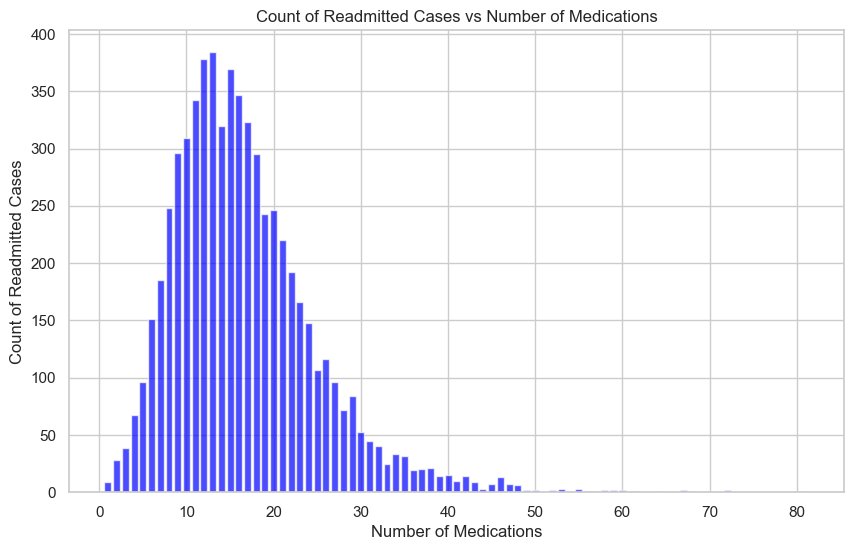

In [130]:
#Plot a graph that displays the count of target variable against the number of medications
# Filtering data for cases where 'readmitted' is 'Yes'
readmitted_df = df[df['readmitted'] == 1]

# Grouping by number of medications and counting occurrences
medication_counts = readmitted_df['num_medications'].value_counts().sort_index()

# Plotting the graph
plt.figure(figsize=(10, 6))
plt.bar(medication_counts.index, medication_counts.values, color='blue', alpha=0.7)
plt.xlabel('Number of Medications')
plt.ylabel('Count of Readmitted Cases')
plt.title('Count of Readmitted Cases vs Number of Medications')
plt.grid(True)
plt.show()

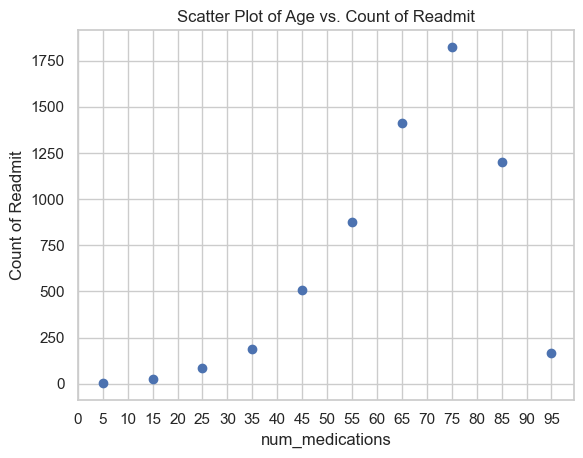

In [131]:
filtered_df = df[df['readmitted'] == 1]

# Count the occurrences of each age value in the filtered DataFrame
age_counts = filtered_df['age'].value_counts().sort_index()

# Plot the scatter plot of count of age values vs. 'readmitted'
plt.scatter(age_counts.index, age_counts.values)
plt.xlabel('num_medications')
plt.ylabel('Count of Readmit')
plt.title('Scatter Plot of Age vs. Count of Readmit')
plt.xticks(range(0, max(age_counts.index) + 1, 5))

plt.show()

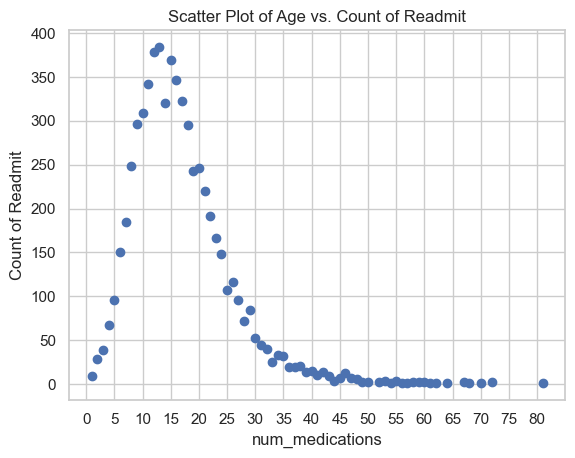

In [132]:
filtered_df = df[df['readmitted'] == 1]

# Count the occurrences of each age value in the filtered DataFrame
age_counts = filtered_df['num_medications'].value_counts().sort_index()

# Plot the scatter plot of count of age values vs. 'readmitted'
plt.scatter(age_counts.index, age_counts.values)
plt.xlabel('num_medications')
plt.ylabel('Count of Readmit')
plt.title('Scatter Plot of Age vs. Count of Readmit')
plt.xticks(range(0, max(age_counts.index) + 1, 5))

plt.show()

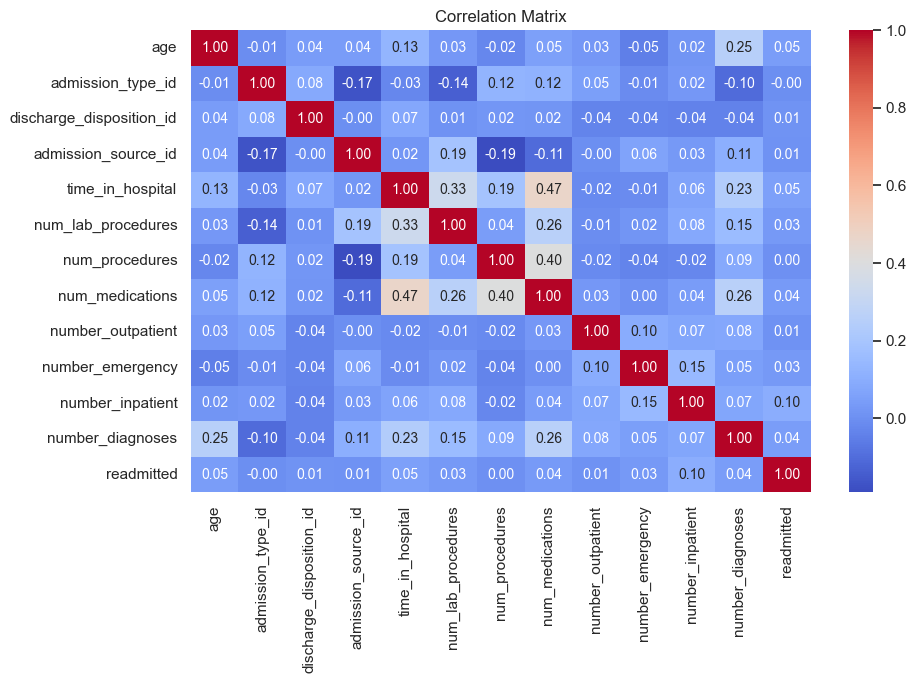

In [133]:
#correlatio matrix
numeric_cols = ['age', 'admission_type_id', 'discharge_disposition_id', 'admission_source_id', 
                'time_in_hospital', 'num_lab_procedures', 'num_procedures', 'num_medications', 
                'number_outpatient', 'number_emergency', 'number_inpatient', 'number_diagnoses', 
                'readmitted']
numeric_df = df[numeric_cols]  # Select numeric columns only
correlation_matrix = numeric_df.corr()
plt.figure(figsize=(10, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", annot_kws={"size": 10})
plt.title('Correlation Matrix')
plt.show()

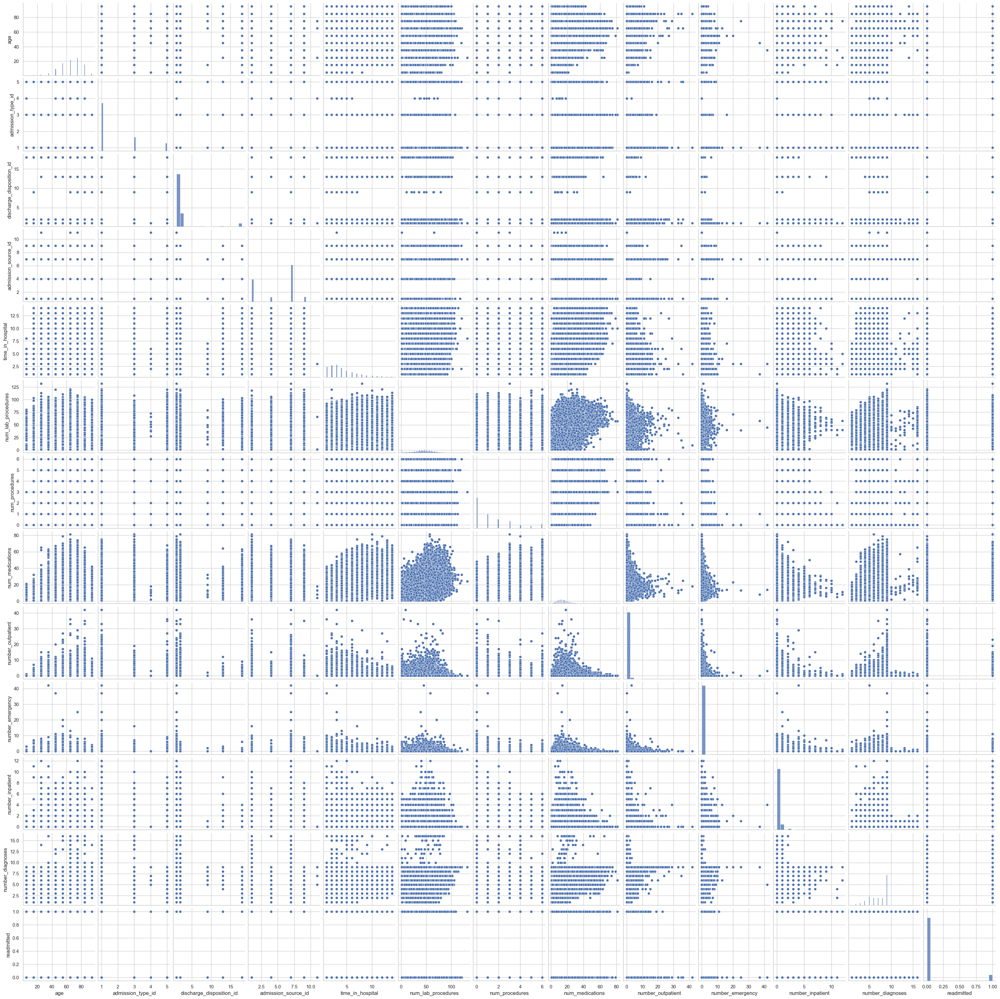

In [134]:
#scatter matrix
sns.pairplot(df[numeric_cols])
plt.show()

### Model Building

##### Data Normalisation

In [136]:
# Selecting only numerical columns for normalization
df_norm = df.select_dtypes(include=[np.number])

epsilon = 1e-8  # Small positive constant to avoid division by zero

# Normalizing the numerical columns using min-max scaling
df_norm = (df_norm - df_norm.min()) / (df_norm.max() - df_norm.min() + epsilon)

# Generating descriptive statistics for the normalized numerical columns
df_norm.describe()

,race,gender,age,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,num_lab_procedures,num_procedures,num_medications,...,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone,change,diabetesMed,readmitted,health_index,severity_of_disease,number_of_changes
count,70431.000000,70431.000000,70431.000000,70431.000000,70431.000000,70431.000000,70431.000000,70431.000000,70431.000000,70431.000000,...,70431.000000,70431.0,70431.000000,70431.000000,70431.000000,70431.000000,70431.00000,70431.000000,70431.000000,70431.000000
mean,0.134926,0.468018,0.672408,0.211082,0.062243,0.398813,0.252591,0.319977,0.237010,0.183334,...,0.000099,0.0,0.000028,0.000014,0.449546,0.761114,0.08935,0.919881,0.360976,0.065475
std,0.267715,0.498980,0.177524,0.342636,0.215092,0.292667,0.226131,0.151927,0.292482,0.103535,...,0.009969,0.0,0.005329,0.003768,0.497451,0.426406,0.28525,0.218297,0.138212,0.118960
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.555556,0.000000,0.000000,0.000000,0.076923,0.229008,0.000000,0.112500,...,0.000000,0.0,0.000000,0.000000,0.000000,1.000000,0.00000,1.000000,0.272654,0.000000
50%,0.000000,0.000000,0.666667,0.000000,0.000000,0.600000,0.153846,0.328244,0.166667,0.162500,...,0.000000,0.0,0.000000,0.000000,0.000000,1.000000,0.00000,1.000000,0.358192,0.000000
75%,0.000000,1.000000,0.777778,0.500000,0.000000,0.600000,0.384615,0.427481,0.333333,0.237500,...,0.000000,0.0,0.000000,0.000000,1.000000,1.000000,0.00000,1.000000,0.449077,0.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,0.0,1.000000,1.000000,1.000000,1.000000,1.00000,1.000000,0.999731,1.000000


In [137]:
# Creating a logistic regression classifier
clf = linear_model.LogisticRegression()

# Defining the feature columns and target variable
f_cols = df_norm.drop(['readmitted'], axis=1)
X0 = df_norm.loc[:, df_norm.columns != 'readmitted']
Y0 = df['readmitted']

# Fitting the logistic regression model
clf.fit(X, Y)

# Printing model evaluation metrics and coefficients
print("Model score:\n {}".format(clf.score(X,Y)))
print("Intercept:\n {}".format(clf.intercept_))
print("Coefficients:\n")
for feat, coef in zip(f_cols, clf.coef_[0]):
    print(" {:>20}: {}".format(feat, coef))

Model score:
 0.920483411592641
Intercept:
 [-2.44759936]
Coefficients:

                 race: -0.04536429549558047
               gender: -0.038444944222912926
                  age: -0.04185522681344334
    admission_type_id: 0.0385522748145016
 discharge_disposition_id: -0.013334889851248264
  admission_source_id: 0.028817503376754584
     time_in_hospital: 0.018425263396676623
   num_lab_procedures: 0.06959794117324525
       num_procedures: -0.07299321904847618
      num_medications: 0.02124885593827319
    number_outpatient: -0.2948819627447048
     number_emergency: 0.05672802162833326
     number_inpatient: -0.02666563083531635
     number_diagnoses: -0.2122815638885557
            metformin: -0.32177763270320386


In [138]:
numercial_features = list(df.select_dtypes(include=[np.number]))
numercial_features.remove('readmitted')

In [139]:
# Creating a logistic regression classifier
clf = linear_model.LogisticRegression()

# Defining the feature columns and target variable
X = df[numercial_features]
Y = df['readmitted']

# Fitting the logistic regression model
clf.fit(X, Y)

# Printing model evaluation metrics and coefficients
print("Model score:\n {}".format(clf.score(X,Y)))
print("Intercept:\n {}".format(clf.intercept_))
print("Coefficients:\n")
for feat, coef in zip(numercial_features, clf.coef_[0]):
    print(" {:>20}: {}".format(feat, coef))

Model score:
 0.9105223552129034
Intercept:
 [-0.0015869]
Coefficients:

                 race: -0.011271290894017712
               gender: 0.004841150623983289
                  age: 0.008632594220535372
    admission_type_id: 0.0013646058402991704
 discharge_disposition_id: 0.010145724959864509
  admission_source_id: -0.003426509377200745
     time_in_hospital: 0.03433515631661657
   num_lab_procedures: 0.0012270300047939138
       num_procedures: -0.018645974231679116
      num_medications: 0.004554850973543742
    number_outpatient: -0.00436287860634469
     number_emergency: 0.07677487035121443
     number_inpatient: 0.3335143087323727
     number_diagnoses: 0.03174609383715686
            metformin: -0.005877984481896051
          repaglinide: 0.01201195427508231
          nateglinide: -0.012359409613083742
       chlorpropamide: -0.011718762901332537
          glimepiride: -0.005662807576797396
        acetohexamide: 0.02981202431387097
            glipizide: 0.0005540533651287

 We have built up an initial model wherein we have used all the dataset. 
The model has a good score (prediction accuracy) of about 90%.

In [141]:
# Splitting the data into training and testing sets
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2)

# Creating and fitting the logistic regression model
clf = linear_model.LogisticRegression()
clf.fit(X_train, Y_train)

# Printing model scores against training and test data
print("Score against training data: {}".format(clf.score(X_train, Y_train)))
print("Score against test data: {}".format(clf.score(X_test, Y_test)))

Score against training data: 0.9100170381939514
Score against test data: 0.9127564421097466


 Splitting the data into a training and a test sets seems to give us similar scores. 
 Trying to improve the model may come from integrating some of the categorical variables.
 For that purpose, we will convert those categorical variables into numeric by using 
labelEncoder, where it gives each category a unique number starting from 0

In [142]:
# Selecting categorical columns
df_cat_cols = df.select_dtypes(include=['object'])
df_cat_cols.head()

,medical_specialty,diag_1,diag_2,diag_3
0,pediatrics,diabetes,diabetes,diabetes
1,missing,other,diabetes,other
2,missing,pregnecy,diabetes,other
3,missing,other,diabetes,circulatory
4,missing,neoplasms,neoplasms,diabetes


In [143]:
le = LabelEncoder()
for col in df_cat_cols:
    df[col] = le.fit_transform(df[col])

In [144]:
df.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
race,70431.0,0.269853,0.535429,0.000000e+00,0.000000,0.000000,0.000000,2.000000
gender,70431.0,0.468018,0.498980,0.000000e+00,0.000000,0.000000,1.000000,1.000000
age,70431.0,65.516676,15.977185,5.000000e+00,55.000000,65.000000,75.000000,95.000000
admission_type_id,70431.0,1.844330,1.370545,1.000000e+00,1.000000,1.000000,3.000000,5.000000
discharge_disposition_id,70431.0,2.058128,3.656561,1.000000e+00,1.000000,1.000000,1.000000,18.000000
admission_source_id,70431.0,4.988130,2.926673,1.000000e+00,1.000000,7.000000,7.000000,11.000000
time_in_hospital,70431.0,4.283682,2.939699,1.000000e+00,2.000000,3.000000,6.000000,14.000000
medical_specialty,70431.0,1.547614,1.736881,0.000000e+00,0.000000,2.000000,2.000000,7.000000
num_lab_procedures,70431.0,42.917011,19.902483,1.000000e+00,31.000000,44.000000,57.000000,132.000000
num_procedures,70431.0,1.422058,1.754894,0.000000e+00,0.000000,1.000000,2.000000,6.000000


##### use the RFE feature selection from sklearn.

In [145]:
# Create a logistic regression model
model = linear_model.LogisticRegression()

# Define the feature matrix X0 and the target variable Y0
X0 = df.loc[:, df.columns != 'readmitted']
Y0 = df['readmitted']

# Initialize the RFE selector with a logistic regression model and select 25 features with a step of 2
selector = feature_selection.RFE(model, n_features_to_select=25, step=2)

# Fit the selector to the data
selector = selector.fit(X0, Y0)

# Get the selected features based on the support_ attribute of the selector
selected_features = X0.loc[:, selector.support_]

# Print the selected features
print("Selected features:\n{}".format(',\n'.join(list(selected_features))))

Selected features:
race,
age,
discharge_disposition_id,
time_in_hospital,
medical_specialty,
num_procedures,
number_outpatient,
number_emergency,
number_inpatient,
diag_1,
number_diagnoses,
repaglinide,
nateglinide,
chlorpropamide,
acetohexamide,
tolbutamide,
troglitazone,
tolazamide,
glimepiride-pioglitazone,
metformin-rosiglitazone,
metformin-pioglitazone,
change,
diabetesMed,
health_index,
number_of_changes


#### Evaluating the model

In [146]:
# Assigning selected features to X
X = selected_features

standardizer = StandardScaler()
X0 = standardizer.fit_transform(X)
X0 = pd.DataFrame(X0, index=X.index, columns=X.columns)
Y0 = df['readmitted']

# Splitting the data into training and testing sets
trainX, testX, trainY, testY = train_test_split(X0, Y0, test_size=0.3, random_state=0)

# Creating a logistic regression classifier
clf = linear_model.LogisticRegression()

# Fitting the classifier to the training data
clf.fit(trainX, trainY)

# Predicting the target variable for the test set
predicted = clf.predict(testX)

# Calculating the mean hits (proportion of correctly predicted instances)
mean_hits = np.mean(predicted == testY)

# Calculating the accuracy score
accuracy_score = metrics.accuracy_score(testY, predicted)

# Performing 10-fold cross-validation and computing the mean scores
scores = cross_val_score(linear_model.LogisticRegression(), X0, Y0, scoring='accuracy', cv=10)
cross_val_mean_scores = scores.mean()

# Printing the mean hits, accuracy score, and cross-validation mean scores
print("Mean hits: {}".format(mean_hits))
print("Accuracy score: {}".format(accuracy_score))
print("Cross-validation mean scores: {}".format(cross_val_mean_scores))

Mean hits: 0.9115002366303834
Accuracy score: 0.9115002366303834
Cross-validation mean scores: 0.9104371677090588


We see that we did not improve the model score but let us carry on and look at another metric 
for evaluating a classifcation model. This time, we are going to generate confusion matrices and then plot the ROC curve. We can then get 
the AUC (Area Under the Curve).

In [148]:
def classify_for_threshold(clf, testX, testY, t):
    # Predicting probabilities for the positive class
    prob_data = pd.DataFrame(clf.predict_proba(testX)[:, 1])
    
    # Classifying based on the specified threshold
    prob_data['predict'] = np.where(prob_data[0] >= t, 1, 0)
    
    # Adding the actual labels
    prob_data['actual'] = testY
    
    # Creating a cross-tabulation of predicted vs. actual labels
    return pd.crosstab(prob_data['actual'], prob_data['predict'])

# Specified thresholds
thresholds = [0.05, 0.10, 0.20]
for threshold in thresholds:
    confusion_matrix = classify_for_threshold(clf, testX, testY, threshold)
    print("\nConfusion Matrix for Threshold {}: \n{}".format(threshold, confusion_matrix))


Confusion Matrix for Threshold 0.05: 
predict    0     1
actual            
0.0      197  4012
1.0       18   445

Confusion Matrix for Threshold 0.1: 
predict     0     1
actual             
0.0      3085  1124
1.0       333   130

Confusion Matrix for Threshold 0.2: 
predict     0   1
actual           
0.0      4144  65
1.0       455   8



From these confusion matrices, you can observe the trade-off between false positives and false negatives as the 
threshold value changes. A lower threshold (e.g., 0.05) tends to classify more instances as positive, resulting in a 
higher number of false positives but fewer false negatives. Conversely, a higher threshold (e.g., 0.2) tends to classify 
more instances as negative, resulting in a lower number of false positives but a higher number of false negatives.

>Threshold 0.1:

FP: 1493 (moderate)
FN: 441 (moderate)
This threshold provides a more balanced trade-off between false positives and false negatives, 
with both values being moderate.


AUC = 0.5984867504067615


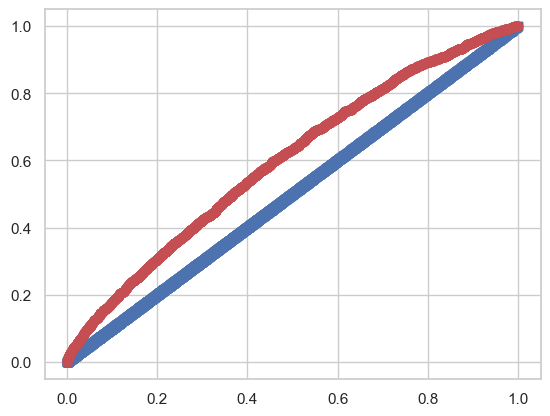

In [149]:
# Predicting probabilities for the positive class
prob = np.array(clf.predict_proba(testX)[:, 1])

# Incrementing testY by 1 to convert the labels to 1 and 2
testY += 1

# Calculating the false positive rate and sensitivity (true positive rate) for ROC curve
fpr, sensitivity, _ = metrics.roc_curve(testY, prob, pos_label=2)

# Computing the Area Under Curve (AUC) for the ROC curve
print("AUC = {}".format(metrics.auc(fpr, sensitivity)))

# Plotting the ROC curve
plt.scatter(fpr, fpr, c='b', marker='s')  # Plotting the line y = x (diagonal)
plt.scatter(fpr, sensitivity, c='r', marker='o')  # Plotting the ROC curve
plt.show()

[[0.91732428 0.08267572]
 [0.91189074 0.08810926]
 [0.96433288 0.03566712]
 ...
 [0.9445388  0.0554612 ]
 [0.9456955  0.0543045 ]
 [0.9327489  0.0672511 ]]


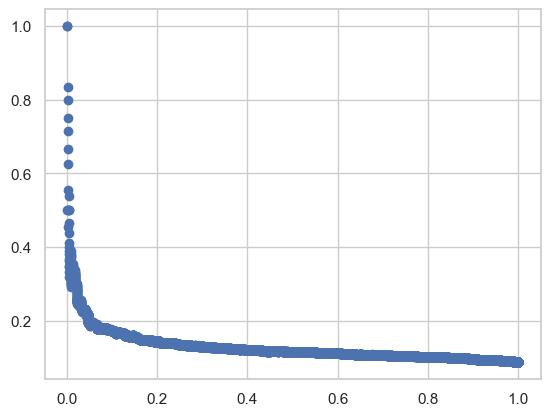

In [150]:
pred_score = clf.predict_proba(testX)
print(pred_score)

testY = testY - 1  # Assuming testY has values 1 and 2

p,r,t = precision_recall_curve(y_true=testY, probas_pred=pred_score[:,1])
plt.figure()
plt.scatter(r,p)
plt.show()

### LogisticRegression with undersampled data

In [151]:
# Assigning selected features to X
X = selected_features

standardizer = StandardScaler()
X0 = standardizer.fit_transform(X)
X0 = pd.DataFrame(X0, index=X.index, columns=X.columns)
Y0 = df['readmitted']

# Create an undersampler object
undersampler = RandomUnderSampler(random_state=42)

# Undersample the data
X_undersampled, y_undersampled = undersampler.fit_resample(X0, Y0)

# Check the new class distribution
print("Original dataset shape:", Counter(Y0))
print("Undersampled dataset shape:", Counter(y_undersampled))

# Split the undersampled data into train and test sets
trainX, testX, trainY, testY = train_test_split(X_undersampled, y_undersampled, test_size=0.3, random_state=0)


# Creating a logistic regression classifier
clf_under = linear_model.LogisticRegression()

# Fitting the classifier to the training data
clf_under.fit(trainX, trainY)

# Predicting the target variable for the test set
predicted = clf_under.predict(testX)

# Calculating the mean hits (proportion of correctly predicted instances)
mean_hits = np.mean(predicted == testY)

# Calculating the accuracy score
accuracy_score = metrics.accuracy_score(testY, predicted)

# Performing 10-fold cross-validation and computing the mean scores
scores = cross_val_score(linear_model.LogisticRegression(), X_undersampled, y_undersampled, scoring='accuracy', cv=10)
cross_val_mean_scores = scores.mean()

# Printing the mean hits, accuracy score, and cross-validation mean scores
print("Mean hits: {}".format(mean_hits))
print("Accuracy score: {}".format(accuracy_score))
print("Cross-validation mean scores: {}".format(cross_val_mean_scores))

Original dataset shape: Counter({0: 64138, 1: 6293})
Undersampled dataset shape: Counter({0: 6293, 1: 6293})
Mean hits: 0.5707097457627118
Accuracy score: 0.5707097457627118
Cross-validation mean scores: 0.5576057157938203


In [152]:
# Specified thresholds
thresholds = [0.4, 0.5, 0.6]
for threshold in thresholds:
    confusion_matrix = classify_for_threshold(clf_under, testX, testY, threshold)
    print("\nConfusion Matrix for Threshold {}: \n{}".format(threshold, confusion_matrix))


Confusion Matrix for Threshold 0.4: 
predict   0   1
actual         
0.0      12  74
1.0      15  64

Confusion Matrix for Threshold 0.5: 
predict   0   1
actual         
0.0      45  41
1.0      37  42

Confusion Matrix for Threshold 0.6: 
predict   0   1
actual         
0.0      73  13
1.0      68  11


AUC = 0.6060575528140009


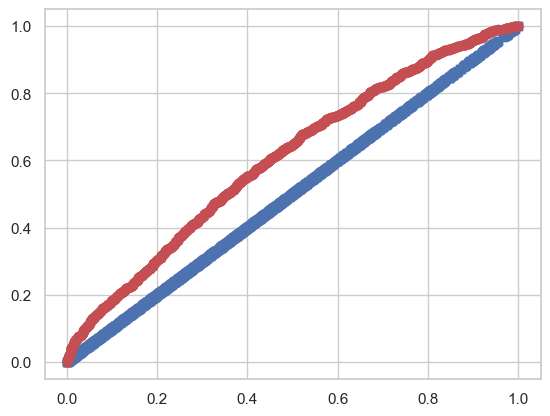

In [153]:
# Predicting probabilities for the positive class
prob = np.array(clf_under.predict_proba(testX)[:, 1])

# Incrementing testY by 1 to convert the labels to 1 and 2
testY += 1

# Calculating the false positive rate and sensitivity (true positive rate) for ROC curve
fpr, sensitivity, _ = metrics.roc_curve(testY, prob, pos_label=2)

# Computing the Area Under Curve (AUC) for the ROC curve
print("AUC = {}".format(metrics.auc(fpr, sensitivity)))

# Plotting the ROC curve
plt.scatter(fpr, fpr, c='b', marker='s')  # Plotting the line y = x (diagonal)
plt.scatter(fpr, sensitivity, c='r', marker='o')  # Plotting the ROC curve
plt.show()

[[0.93119227 0.06880773]
 [0.89693006 0.10306994]
 [0.92510562 0.07489438]
 ...
 [0.93173107 0.06826893]
 [0.92641242 0.07358758]
 [0.89904795 0.10095205]]


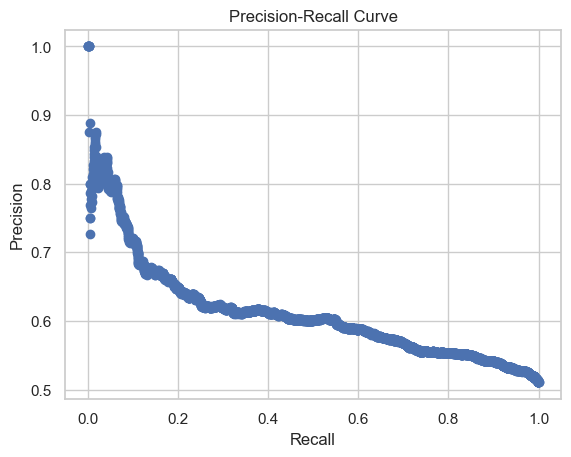

In [155]:
pred_score = clf.predict_proba(testX)
print(pred_score)

testY = testY - 1  # testY has values 1 and 2

p, r, t = precision_recall_curve(y_true=testY, probas_pred=pred_score[:, 1])

plt.figure()
plt.scatter(r, p)

# Add labels to the x-axis and y-axis
plt.xlabel('Recall')
plt.ylabel('Precision')

# Add a title to the plot (optional)
plt.title('Precision-Recall Curve')

plt.show()

### LogisticRegression with oversampled data

In [156]:
# Assigning selected features to X
X = selected_features

standardizer = StandardScaler()
X0 = standardizer.fit_transform(X)
X0 = pd.DataFrame(X0, index=X.index, columns=X.columns)
Y0 = df['readmitted']

# Create an undersampler object
oversampler = RandomOverSampler(random_state=42)

# Undersample the data
X_over, y_over = oversampler.fit_resample(X0, Y0)

# Check the new class distribution
print("Original dataset shape:", Counter(Y0))
print("OverSampled dataset shape:", Counter(y_over))

# Split the undersampled data into train and test sets
trainX, testX, trainY, testY = train_test_split(X_over, y_over, test_size=0.3, random_state=0)


# Creating a logistic regression classifier
clf_over = linear_model.LogisticRegression()

# Fitting the classifier to the training data
clf_over.fit(trainX, trainY)

# Predicting the target variable for the test set
predicted = clf_over.predict(testX)

# Calculating the mean hits (proportion of correctly predicted instances)
mean_hits = np.mean(predicted == testY)

# Calculating the accuracy score
accuracy_score = metrics.accuracy_score(testY, predicted)

# Performing 10-fold cross-validation and computing the mean scores
scores = cross_val_score(linear_model.LogisticRegression(), X_over, y_over, scoring='accuracy', cv=10)
cross_val_mean_scores = scores.mean()

# Printing the mean hits, accuracy score, and cross-validation mean scores
print("Mean hits: {}".format(mean_hits))
print("Accuracy score: {}".format(accuracy_score))
print("Cross-validation mean scores: {}".format(cross_val_mean_scores))

Original dataset shape: Counter({0: 64138, 1: 6293})
OverSampled dataset shape: Counter({0: 64138, 1: 64138})
Mean hits: 0.5734480160070681
Accuracy score: 0.5734480160070681
Cross-validation mean scores: 0.5538603636812345


In [157]:
# Specified thresholds
thresholds = [0.4, 0.5, 0.6]
for threshold in thresholds:
    confusion_matrix = classify_for_threshold(clf_over, testX, testY, threshold)
    print("\nConfusion Matrix for Threshold {}: \n{}".format(threshold, confusion_matrix))


Confusion Matrix for Threshold 0.4: 
predict     0     1
actual             
0.0      1438  8865
1.0       134  1019

Confusion Matrix for Threshold 0.5: 
predict     0     1
actual             
0.0      5704  4599
1.0       656   497

Confusion Matrix for Threshold 0.6: 
predict     0     1
actual             
0.0      8936  1367
1.0      1005   148


AUC = 0.6071664017077856


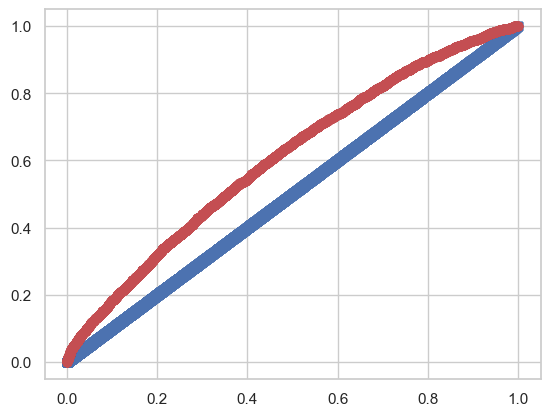

In [158]:
# Predicting probabilities for the positive class
prob = np.array(clf_over.predict_proba(testX)[:, 1])

# Incrementing testY by 1 to convert the labels to 1 and 2
testY += 1

# Calculating the false positive rate and sensitivity (true positive rate) for ROC curve
fpr, sensitivity, _ = metrics.roc_curve(testY, prob, pos_label=2)

# Computing the Area Under Curve (AUC) for the ROC curve
print("AUC = {}".format(metrics.auc(fpr, sensitivity)))

# Plotting the ROC curve
plt.scatter(fpr, fpr, c='b', marker='s')  # Plotting the line y = x (diagonal)
plt.scatter(fpr, sensitivity, c='r', marker='o')  # Plotting the ROC curve
plt.show()

[[0.54350256 0.45649744]
 [0.40885028 0.59114972]
 [0.57326027 0.42673973]
 ...
 [0.45579507 0.54420493]
 [0.50226554 0.49773446]
 [0.4460564  0.5539436 ]]


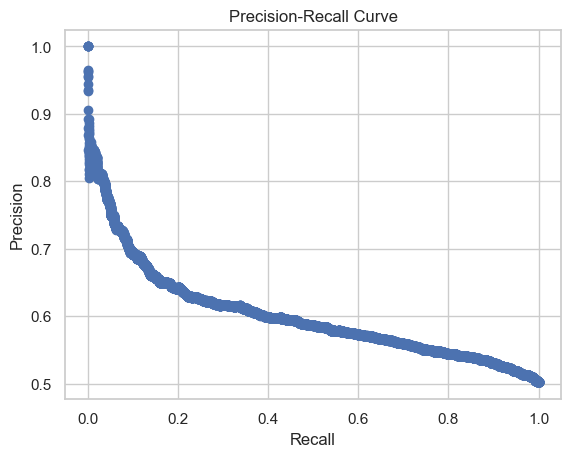

In [159]:
pred_score = clf_over.predict_proba(testX)
print(pred_score)

testY = testY - 1  # testY has values 1 and 2

p, r, t = precision_recall_curve(y_true=testY, probas_pred=pred_score[:, 1])

plt.figure()
plt.scatter(r, p)

# Add labels to the x-axis and y-axis
plt.xlabel('Recall')
plt.ylabel('Precision')

# Add a title to the plot (optional)
plt.title('Precision-Recall Curve')

plt.show()

## RandomForestClassifier

In [160]:
# Assigning selected features to X
X = selected_features

standardizer = StandardScaler()
X0 = standardizer.fit_transform(X)
X0 = pd.DataFrame(X0, index=X.index, columns=X.columns)
Y0 = df['readmitted']

# Split the undersampled data into train and test sets
trainX, testX, trainY, testY = train_test_split(X0, Y0, test_size=0.3, random_state=0)


#Builds up a Random Forest classifier
crf = RandomForestClassifier(n_jobs=-1, n_estimators=400, min_samples_leaf=5, \
                             max_depth = 30, oob_score=True)
crf.fit(trainX,trainY)

# Predicting the target variable for the test set
predicted = crf.predict(testX)

# Calculating the mean hits (proportion of correctly predicted instances)
mean_hits = np.mean(predicted == testY)

# Calculating the accuracy score
accuracy_score = metrics.accuracy_score(testY, predicted)

# Performing 10-fold cross-validation and computing the mean scores
scores = cross_val_score(linear_model.LogisticRegression(), X0, Y0, scoring='accuracy', cv=10)
cross_val_mean_scores = scores.mean()

# Printing the mean hits, accuracy score, and cross-validation mean scores
print("Mean hits: {}".format(mean_hits))
print("Accuracy score: {}".format(accuracy_score))
print("Cross-validation mean scores: {}".format(cross_val_mean_scores))

Mean hits: 0.9114529105537151
Accuracy score: 0.9114529105537151
Cross-validation mean scores: 0.9104371677090588


In [161]:
# Specified thresholds
thresholds = [0.05, 0.10, 0.20]
for threshold in thresholds:
    confusion_matrix = classify_for_threshold(crf, testX, testY, threshold)
    print("\nConfusion Matrix for Threshold {}: \n{}".format(threshold, confusion_matrix))


Confusion Matrix for Threshold 0.05: 
predict    0     1
actual            
0.0      927  3282
1.0      108   355

Confusion Matrix for Threshold 0.1: 
predict     0     1
actual             
0.0      2810  1399
1.0       303   160

Confusion Matrix for Threshold 0.2: 
predict     0    1
actual            
0.0      4049  160
1.0       443   20


AUC = 0.6197285527068375


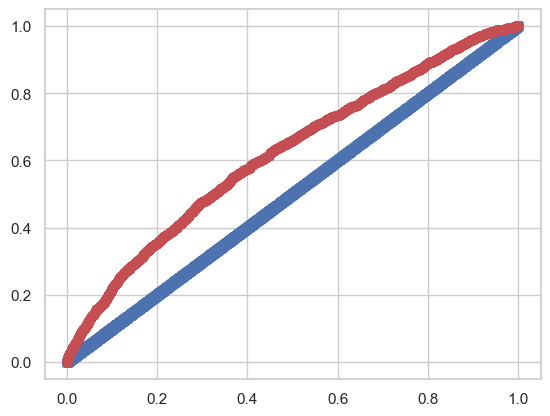

In [162]:
# Predicting probabilities for the positive class
prob = np.array(crf.predict_proba(testX)[:, 1])

# Incrementing testY by 1 to convert the labels to 1 and 2
testY += 1

# Calculating the false positive rate and sensitivity (true positive rate) for ROC curve
fpr, sensitivity, _ = metrics.roc_curve(testY, prob, pos_label=2)

# Computing the Area Under Curve (AUC) for the ROC curve
print("AUC = {}".format(metrics.auc(fpr, sensitivity)))

# Plotting the ROC curve
plt.scatter(fpr, fpr, c='b', marker='s')  # Plotting the line y = x (diagonal)
plt.scatter(fpr, sensitivity, c='r', marker='o')  # Plotting the ROC curve
plt.show()

[[0.92511138 0.07488862]
 [0.90223284 0.09776716]
 [0.97299707 0.02700293]
 ...
 [0.93753622 0.06246378]
 [0.9654025  0.0345975 ]
 [0.96938624 0.03061376]]


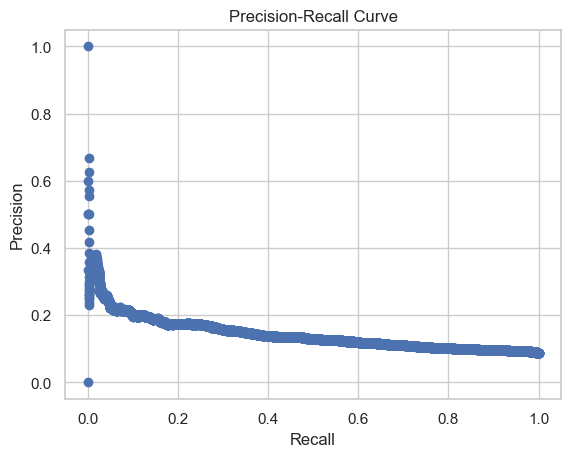

In [163]:
pred_score = crf.predict_proba(testX)
print(pred_score)

testY = testY - 1  # testY has values 1 and 2

p, r, t = precision_recall_curve(y_true=testY, probas_pred=pred_score[:, 1])

plt.figure()
plt.scatter(r, p)

# Add labels to the x-axis and y-axis
plt.xlabel('Recall')
plt.ylabel('Precision')

# Add a title to the plot (optional)
plt.title('Precision-Recall Curve')

plt.show()

#### RandomForestClassifier with undersampled data

In [164]:
# Assigning selected features to X
X = selected_features

standardizer = StandardScaler()
X0 = standardizer.fit_transform(X)
X0 = pd.DataFrame(X0, index=X.index, columns=X.columns)
Y0 = df['readmitted']

# Create an undersampler object
undersampler = RandomUnderSampler(random_state=42)

# Undersample the data
X_under, y_under = undersampler.fit_resample(X0, Y0)

# Check the new class distribution
print("Original dataset shape:", Counter(Y0))
print("Undersampled dataset shape:", Counter(y_over))

# Split the undersampled data into train and test sets
trainX, testX, trainY, testY = train_test_split(X_under, y_under, test_size=0.3, random_state=0)


#Builds up a Random Forest classifier
crf_under = RandomForestClassifier(n_jobs=-1, n_estimators=400, min_samples_leaf=5, \
                             max_depth = 30, oob_score=True)
crf_under.fit(trainX,trainY)

# Predicting the target variable for the test set
predicted = crf_under.predict(testX)

# Calculating the mean hits (proportion of correctly predicted instances)
mean_hits = np.mean(predicted == testY)

# Calculating the accuracy score
accuracy_score = metrics.accuracy_score(testY, predicted)

# Performing 10-fold cross-validation and computing the mean scores
scores = cross_val_score(linear_model.LogisticRegression(), X_under, y_under, scoring='accuracy', cv=10)
cross_val_mean_scores = scores.mean()

# Printing the mean hits, accuracy score, and cross-validation mean scores
print("Mean hits: {}".format(mean_hits))
print("Accuracy score: {}".format(accuracy_score))
print("Cross-validation mean scores: {}".format(cross_val_mean_scores))

Original dataset shape: Counter({0: 64138, 1: 6293})
Undersampled dataset shape: Counter({0: 64138, 1: 64138})
Mean hits: 0.5979872881355932
Accuracy score: 0.5979872881355932
Cross-validation mean scores: 0.5576057157938203


In [165]:
# Specified thresholds
thresholds = [0.3, 0.4, 0.5]
for threshold in thresholds:
    confusion_matrix = classify_for_threshold(crf_under, testX, testY, threshold)
    print("\nConfusion Matrix for Threshold {}: \n{}".format(threshold, confusion_matrix))


Confusion Matrix for Threshold 0.3: 
predict  0   1
actual        
0.0      3  83
1.0      4  75

Confusion Matrix for Threshold 0.4: 
predict   0   1
actual         
0.0      20  66
1.0      21  58

Confusion Matrix for Threshold 0.5: 
predict   0   1
actual         
0.0      44  42
1.0      34  45


AUC = 0.6350172311545561


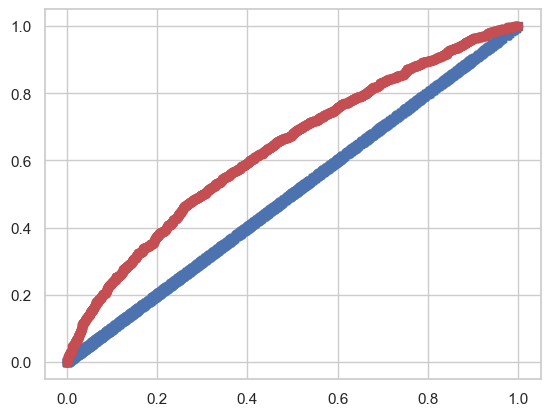

In [166]:
# Predicting probabilities for the positive class
prob = np.array(crf_under.predict_proba(testX)[:, 1])

# Incrementing testY by 1 to convert the labels to 1 and 2
testY += 1

# Calculating the false positive rate and sensitivity (true positive rate) for ROC curve
fpr, sensitivity, _ = metrics.roc_curve(testY, prob, pos_label=2)

# Computing the Area Under Curve (AUC) for the ROC curve
print("AUC = {}".format(metrics.auc(fpr, sensitivity)))

# Plotting the ROC curve
plt.scatter(fpr, fpr, c='b', marker='s')  # Plotting the line y = x (diagonal)
plt.scatter(fpr, sensitivity, c='r', marker='o')  # Plotting the ROC curve
plt.show()

[[0.3287414  0.6712586 ]
 [0.35673506 0.64326494]
 [0.62054201 0.37945799]
 ...
 [0.45290486 0.54709514]
 [0.67111311 0.32888689]
 [0.58111498 0.41888502]]


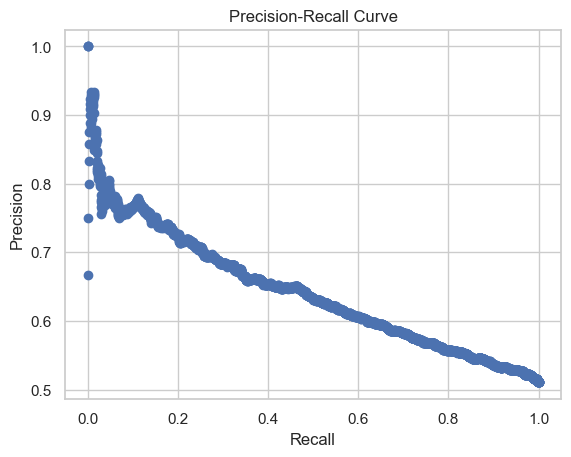

In [167]:
pred_score = crf_under.predict_proba(testX)
print(pred_score)

testY = testY - 1  # testY has values 1 and 2

p, r, t = precision_recall_curve(y_true=testY, probas_pred=pred_score[:, 1])

plt.figure()
plt.scatter(r, p)

# Add labels to the x-axis and y-axis
plt.xlabel('Recall')
plt.ylabel('Precision')

# Add a title to the plot (optional)
plt.title('Precision-Recall Curve')

plt.show()

### RandomForestClassifier with oversampled data

In [168]:
# Assigning selected features to X
X = selected_features

standardizer = StandardScaler()
X0 = standardizer.fit_transform(X)
X0 = pd.DataFrame(X0, index=X.index, columns=X.columns)
Y0 = df['readmitted']

# Create an undersampler object
oversampler = RandomOverSampler(random_state=42)

# Undersample the data
X_over, y_over = oversampler.fit_resample(X0, Y0)

# Check the new class distribution
print("Original dataset shape:", Counter(Y0))
print("Oversampled dataset shape:", Counter(y_over))

# Split the undersampled data into train and test sets
trainX, testX, trainY, testY = train_test_split(X_over, y_over, test_size=0.3, random_state=0)


#Builds up a Random Forest classifier
crf_over = RandomForestClassifier(n_jobs=-1, n_estimators=400, min_samples_leaf=5, \
                             max_depth = 30, oob_score=True)
crf_over.fit(trainX,trainY)

# Predicting the target variable for the test set
predicted = crf_over.predict(testX)

# Calculating the mean hits (proportion of correctly predicted instances)
mean_hits = np.mean(predicted == testY)

# Calculating the accuracy score
accuracy_score = metrics.accuracy_score(testY, predicted)

# Performing 10-fold cross-validation and computing the mean scores
scores = cross_val_score(linear_model.LogisticRegression(), trainX, trainY, scoring='accuracy', cv=10)
cross_val_mean_scores = scores.mean()

# Printing the mean hits, accuracy score, and cross-validation mean scores
print("Mean hits: {}".format(mean_hits))
print("Accuracy score: {}".format(accuracy_score))
print("Cross-validation mean scores: {}".format(cross_val_mean_scores))

Original dataset shape: Counter({0: 64138, 1: 6293})
Oversampled dataset shape: Counter({0: 64138, 1: 64138})
Mean hits: 0.852532286983863
Accuracy score: 0.852532286983863
Cross-validation mean scores: 0.574944417449178


In [169]:
# Specified thresholds
thresholds = [0.4, 0.5, 0.6]
for threshold in thresholds:
    confusion_matrix = classify_for_threshold(crf_over, testX, testY, threshold)
    print("\nConfusion Matrix for Threshold {}: \n{}".format(threshold, confusion_matrix))


Confusion Matrix for Threshold 0.4: 
predict     0     1
actual             
0.0      3412  6891
1.0       359   794

Confusion Matrix for Threshold 0.5: 
predict     0     1
actual             
0.0      4982  5321
1.0       551   602

Confusion Matrix for Threshold 0.6: 
predict     0     1
actual             
0.0      6581  3722
1.0       729   424


AUC = 0.933965828396578


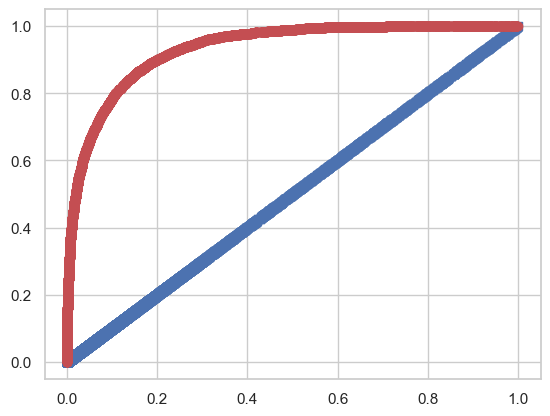

In [170]:
# Predicting probabilities for the positive class
prob = np.array(crf_over.predict_proba(testX)[:, 1])

# Incrementing testY by 1 to convert the labels to 1 and 2
testY += 1

# Calculating the false positive rate and sensitivity (true positive rate) for ROC curve
fpr, sensitivity, _ = metrics.roc_curve(testY, prob, pos_label=2)

# Computing the Area Under Curve (AUC) for the ROC curve
print("AUC = {}".format(metrics.auc(fpr, sensitivity)))

# Plotting the ROC curve
plt.scatter(fpr, fpr, c='b', marker='s')  # Plotting the line y = x (diagonal)
plt.scatter(fpr, sensitivity, c='r', marker='o')  # Plotting the ROC curve
plt.show()

[[0.50320364 0.49679636]
 [0.24516029 0.75483971]
 [0.42701012 0.57298988]
 ...
 [0.58306076 0.41693924]
 [0.37361939 0.62638061]
 [0.4009189  0.5990811 ]]


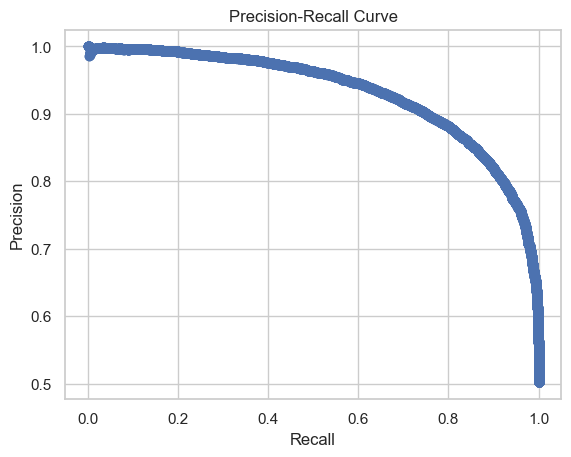

In [171]:
pred_score = crf_over.predict_proba(testX)
print(pred_score)

testY = testY - 1  # testY has values 1 and 2

p, r, t = precision_recall_curve(y_true=testY, probas_pred=pred_score[:, 1])

plt.figure()
plt.scatter(r, p)

# Add labels to the x-axis and y-axis
plt.xlabel('Recall')
plt.ylabel('Precision')

# Add a title to the plot (optional)
plt.title('Precision-Recall Curve')

plt.show()

## K means Clustering

##### Elbow Method for Optimal Number of Clusters

Text(0.5, 1.0, 'Elbow Method for Optimal Number of Clusters')

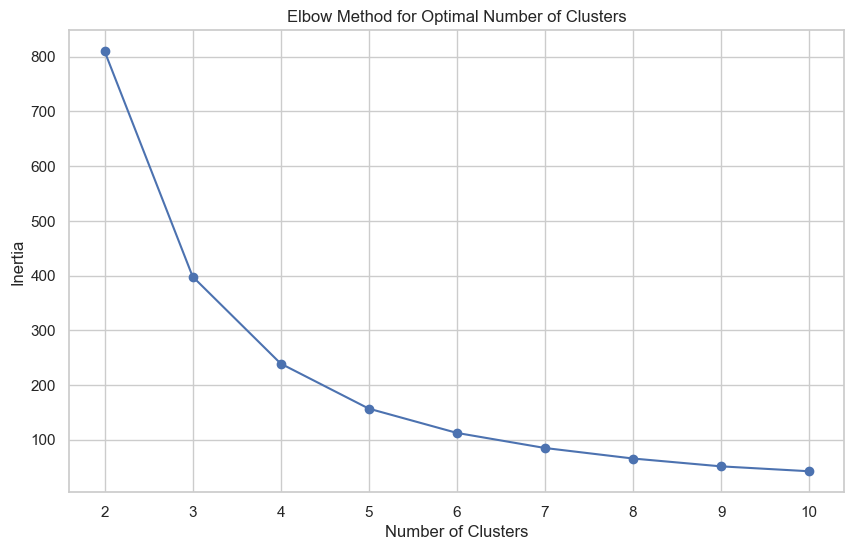

In [172]:
# Implement K-means clustering on the predictions

# Get the predicted probabilities
predictions = crf_over.predict_proba(testX)

# Implement the elbow method to find the optimal number of clusters
inertias = []
for k in range(2, 11):
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(predictions)
    inertias.append(kmeans.inertia_)

# Plot the elbow curve
plt.figure(figsize=(10, 6))
plt.plot(range(2, 11), inertias, marker='o')
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia')
plt.title('Elbow Method for Optimal Number of Clusters')

Optimal number of clusters: 4


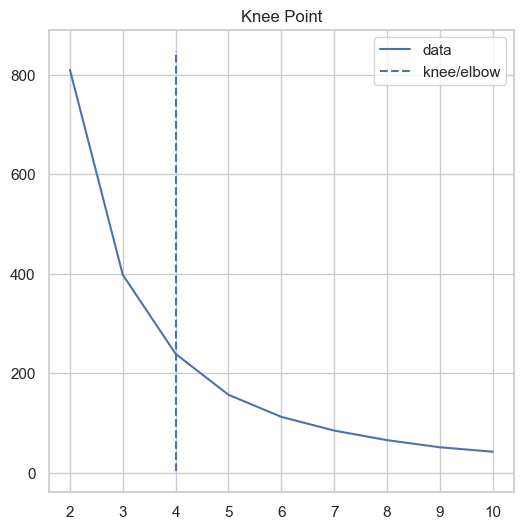

In [173]:
# Use KneeLocator to find the optimal number of clusters
kl = KneeLocator(range(2, 11), inertias, curve='convex', direction='decreasing')
optimal_k = kl.knee

# Visualize the KneeLocator's identified "knee" point
kl.plot_knee()

# Print the optimal number of clusters
print(f"Optimal number of clusters: {optimal_k}")

In [174]:
# Create the K-means clusterer
kmeans = KMeans(n_clusters=optimal_k, random_state=42)

# Fit the K-means model to the predictions
clusters = kmeans.fit_predict(predictions)

# Print the cluster assignments
print("Cluster assignments:", clusters)

Cluster assignments: [3 2 0 ... 3 0 0]


In [175]:
# Now you can compare clusters with the target variable distribution
print("Cluster distribution:")
for cluster in range(optimal_k):
    cluster_samples = testX[clusters == cluster]
    cluster_targets = testY[clusters == cluster]
    print(f"Cluster {cluster}:")
    print(Counter(cluster_targets))

Cluster distribution:
Cluster 0:
Counter({1: 8273, 0: 2543})
Cluster 1:
Counter({0: 8905, 1: 128})
Cluster 2:
Counter({1: 8091, 0: 218})
Cluster 3:
Counter({0: 7510, 1: 2815})


In [176]:
# Build local classifiers based on clustering
local_classifiers = {}
for cluster in range(optimal_k):
    cluster_samples = testX[clusters == cluster]
    cluster_targets = testY[clusters == cluster]
    local_clf = RandomForestClassifier(n_estimators=100, random_state=42)  
    local_clf.fit(cluster_samples, cluster_targets)
    local_classifiers[cluster] = local_clf

In [179]:
# Evaluate the local classifiers
for cluster, local_clf in local_classifiers.items():
    test_samples = testX[clusters == cluster]
    test_targets = testY[clusters == cluster]
    predictions = local_clf.predict(test_samples)
    acc = accuracy_score(test_targets, predictions)  
    print(f"Cluster {cluster} local classifier accuracy: {acc}")

Cluster 0 local classifier accuracy: 0.9699519230769231
Cluster 1 local classifier accuracy: 0.9981180117347503
Cluster 2 local classifier accuracy: 0.9943434829702732
Cluster 3 local classifier accuracy: 0.9698789346246973
